# Assignment

In [31]:
# Import 

import numpy as np
import random
import matplotlib.pyplot as plt
from degree_freedom import degree_freedom_queen
from degree_freedom import degree_freedom_king1
from degree_freedom import degree_freedom_king2
from generate_game import *
from chess_env import ChessEnv
import pickle

size_board = 4

## The Environment

You can find the environment in the file Chess_env, which contains the class Chess_env. To define an object, you need to provide the board size considered as input. In our example, size_board=4. 
Chess_env is composed by the following methods:

1. Initialise_game. The method initialises an episode by placing the three pieces considered (Agent's king and queen, enemy's king) in the chess board. The outputs of the method are described below in order.

     S $\;$ A matrix representing the board locations filled with 4 numbers: 0, no piece in that position; 1, location of the 
     agent's king; 2 location of the queen; 3 location of the enemy king.
     
     X $\;$ The features, that is the input to the neural network. See the assignment for more information regarding the            definition of the features adopted. To personalise this, go into the Features method of the class Chess_env() and change        accordingly.
     
     allowed_a $\;$ The allowed actions that the agent can make. The agent is moving a king, with a total number of 8                possible actions, and a queen, with a total number of $(board_{size}-1)\times 8$ actions. The total number of possible actions correspond      to the sum of the two, but not all actions are allowed in a given position (movements to locations outside the borders or      against chess rules). Thus, the variable allowed_a is a vector that is one (zero) for an action that the agent can (can't)      make. Be careful, apply the policy considered on the actions that are allowed only.
     

2. OneStep. The method performs a one step update of the system. Given as input the action selected by the agent, it updates the chess board by performing that action and the response of the enemy king (which is a random allowed action in the settings considered). The first three outputs are the same as for the Initialise_game method, but the variables are computed for the position reached after the update of the system. The fourth and fifth outputs are:

     R $\;$ The reward. To change this, look at the OneStep method of the class where the rewards are set.
     
     Done $\;$ A variable that is 1 if the episode has ended (checkmate or draw).
     
     
3. Features. Given the chessboard position, the method computes the features.

This information and a quick analysis of the class should be all you need to get going. The other functions that the class exploits are uncommented and constitute an example on how not to write a python code. You can take a look at them if you want, but it is not necessary.






In [2]:
## INITIALISE THE ENVIRONMENT

env=ChessEnv(size_board)

In [3]:
## PRINT 5 STEPS OF AN EPISODE CONSIDERING A RANDOM AGENT

S,X,allowed_a=env.initialise_game()                       # INTIALISE GAME

print(S)                                                  # PRINT CHESS BOARD (SEE THE DESCRIPTION ABOVE)

print('check? ',env.check)                                # PRINT VARIABLE THAT TELLS IF ENEMY KING IS IN CHECK (1) OR NOT (0)
print('dofk2 ',np.sum(env.dfk2_constrain).astype(int))    # PRINT THE NUMBER OF LOCATIONS THAT THE ENEMY KING CAN MOVE TO


for i in range(5):
    
    a,_=np.where(allowed_a==1)                  # FIND WHAT THE ALLOWED ACTIONS ARE
    a_agent=np.random.permutation(a)[0]         # MAKE A RANDOM ACTION

    S,X,allowed_a,R,Done=env.one_step(a_agent)   # UPDATE THE ENVIRONMENT
    
    
    ## PRINT CHESS BOARD AND VARIABLES
    print('')
    print(S)
    print(R,'', Done)
    print('check? ',env.check)
    print('dofk2 ',np.sum(env.dfk2_constrain).astype(int))
    
    
    # TERMINATE THE EPISODE IF Done=True (DRAW OR CHECKMATE)
    if Done:
        break
        


[[3 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 1 0 2]]
check?  0
dofk2  1

[[0 3 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 1 2]]
0  0
check?  0
dofk2  1

[[3 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 1 0 2]]
0  0
check?  0
dofk2  1

[[0 3 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [0 1 0 2]]
0  0
check?  0
dofk2  3

[[3 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 1 0 0]]
0  0
check?  0
dofk2  1

[[0 3 0 0]
 [0 1 0 2]
 [0 1 0 0]
 [0 0 0 0]]
0  0
check?  0
dofk2  1


In [4]:
# PERFORM N_episodes=1000 EPISODES MAKING RANDOM ACTIONS AND COMPUTE THE AVERAGE REWARD AND NUMBER OF MOVES 

S,X,allowed_a=env.initialise_game()
N_episodes=1000

# VARIABLES WHERE TO SAVE THE FINAL REWARD IN AN EPISODE AND THE NUMBER OF MOVES 
R_save_random = np.zeros([N_episodes, 1])
N_moves_save_random = np.zeros([N_episodes, 1])

for n in range(N_episodes):
    
    S,X,allowed_a=env.initialise_game()     # INITIALISE GAME
    Done=0                                  # SET Done=0 AT THE BEGINNING
    i=1                                     # COUNTER FOR THE NUMBER OF ACTIONS (MOVES) IN AN EPISODE
    
    # UNTIL THE EPISODE IS NOT OVER...(Done=0)
    while Done==0:
        
        # SAME AS THE CELL BEFORE, BUT SAVING THE RESULTS WHEN THE EPISODE TERMINATES 
        
        a,_=np.where(allowed_a==1)
        a_agent=np.random.permutation(a)[0]

        S,X,allowed_a,R,Done=env.one_step(a_agent)
        
        
        if Done:
            
            R_save_random[n]=np.copy(R)
            N_moves_save_random[n]=np.copy(i)

            break

        i=i+1                               # UPDATE THE COUNTER



# AS YOU SEE, THE PERFORMANCE OF A RANDOM AGENT ARE NOT GREAT, SINCE THE MAJORITY OF THE POSITIONS END WITH A DRAW 
# (THE ENEMY KING IS NOT IN CHECK AND CAN'T MOVE)

print('Random_Agent, Average reward:',np.mean(R_save_random),'Number of steps: ',np.mean(N_moves_save_random))



Random_Agent, Average reward: 0.208 Number of steps:  7.305


In [21]:
# INITIALISE THE PARAMETERS OF YOUR NEURAL NETWORK AND...
# PLEASE CONSIDER TO USE A MASK OF ONE FOR THE ACTION MADE AND ZERO OTHERWISE IF YOU ARE NOT USING VANILLA GRADIENT DESCENT...
# WE SUGGEST A NETWORK WITH ONE HIDDEN LAYER WITH SIZE 200. 


S,X,allowed_a=env.initialise_game()
N_a=np.shape(allowed_a)[0]   # TOTAL NUMBER OF POSSIBLE ACTIONS

N_in=np.shape(X)[0]    ## INPUT SIZE
N_h=200                ## NUMBER OF HIDDEN NODES


## INITALISE YOUR NEURAL NETWORK...


# HYPERPARAMETERS SUGGESTED (FOR A GRID SIZE OF 4)

epsilon_0 = 0.2     # STARTING VALUE OF EPSILON FOR THE EPSILON-GREEDY POLICY
beta = 0.00005      # THE PARAMETER SETS HOW QUICKLY THE VALUE OF EPSILON IS DECAYING (SEE epsilon_f BELOW)
gamma = 0.85        # THE DISCOUNT FACTOR
eta = 0.0035        # THE LEARNING RATE

N_episodes = 100000 # THE NUMBER OF GAMES TO BE PLAYED 

# SAVING VARIABLES
R_save = np.zeros([N_episodes, 1])
N_moves_save = np.zeros([N_episodes, 1])


In [22]:
def print_game(S, X, allowed_a):
    print(S)

In [24]:
def EpsilonGreedy_Policy(Qvalues, a, epsilon):
    
    N_a=np.shape(Qvalues)[0]

    rand_value=np.random.uniform(0,1)

    rand_a=rand_value<epsilon

    if rand_a==True:
        
        a=random.choice(a)

    else:

        a=np.argmax(Qvalues)

    qvalue = Qvalues[a]
    return a, qvalue

In [25]:
def get_qvalues(Qtable, a, X):
    key = tuple(X)
    
    if key not in Qtable:
        a_transp = np.transpose(a)[0]
        values = np.random.rand(32)
        values = [values[i] if a_transp[i] == 1 else 0 for i in range(len(values))]
        Qtable[key] = values
        
    return Qtable, Qtable[key]

In [27]:
# TRAINING LOOP BONE STRUCTURE...
# I WROTE FOR YOU A RANDOM AGENT (THE RANDOM AGENT WILL BE SLOWER TO GIVE CHECKMATE THAN AN OPTIMISED ONE, 
# SO DON'T GET CONCERNED BY THE TIME IT TAKES), CHANGE WITH YOURS ...
R_history = []
Qtable = {}

for n in range(N_episodes):

    epsilon_f = epsilon_0 / (1 + beta * n)   ## DECAYING EPSILON
    Done = 0                                   ## SET DONE TO ZERO (BEGINNING OF THE EPISODE)
    i = 1                                    ## COUNTER FOR NUMBER OF ACTIONS
    
    S,X,allowed_a = env.initialise_game()      ## INITIALISE GAME
    
    while Done == 0:                           ## START THE EPISODE
        
        a,_ = np.where(allowed_a == 1)
        Qtable, Qvalues = get_qvalues(Qtable, allowed_a, X)
        a_agent, qvalue = EpsilonGreedy_Policy(Qvalues, a, epsilon_f)

                
        S_next,X_next,allowed_a_next,R,Done = env.one_step(a_agent)
        
        ## THE EPISODE HAS ENDED, UPDATE...BE CAREFUL, THIS IS THE LAST STEP OF THE EPISODE
        if Done == 1:
            
            R_history.append(R)

            # Compute the delta
            delta = R - Qtable[tuple(X)][a_agent]
            
            # Update the Qvalues
            Qtable[tuple(X)][a_agent] = Qtable[tuple(X)][a_agent] + eta*delta
            
            print(f"Game {n}")
            print_game(S_next, X_next, allowed_a_next)
            
            break
        
        # IF THE EPISODE IS NOT OVER...
        else:
            # Compute the delta
            _, qvalues_next = get_qvalues(Qtable, allowed_a_next, X_next)
            _, Qvalue_best_action_next = EpsilonGreedy_Policy(qvalues_next, allowed_a_next, 0)
            delta = R + gamma*Qvalue_best_action_next - qvalue

            # Update the Qvalues
            Qtable[tuple(X)][a_agent] = Qtable[tuple(X)][a_agent] + eta*delta
            
            
        # NEXT STATE AND CO. BECOME ACTUAL STATE...     
        S = np.copy(S_next)
        X = np.copy(X_next)
        allowed_a = np.copy(allowed_a_next)
        
        i += 1  # UPDATE COUNTER FOR NUMBER OF ACTIONS

Game 0
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 1
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 2
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 3
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 4
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 5
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 6
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 7
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 8
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 9
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 10
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 11
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 12
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 13
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 15
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 16
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 17
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 18
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Gam

Game 166
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 167
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 168
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 169
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 170
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 171
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 172
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 173
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 174
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 175
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 2 1 2]]
Game 176
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 177
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 178
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 179
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 180
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 181
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 182
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 183
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 184
[[0 0 0 0]
 [0 0 2 

Game 322
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 323
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 324
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 325
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 326
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 327
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 328
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 329
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 330
[[0 0 0 0]
 [0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]]
Game 331
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 332
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 333
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 334
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 335
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 336
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 337
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 338
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 339
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 340
[[0 0 0 3]
 [0 2 0 

Game 478
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 479
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 480
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 481
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 482
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 483
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 484
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 485
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 486
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 487
[[0 0 0 0]
 [0 1 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 488
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 489
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 490
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 491
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 492
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 493
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 494
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 495
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 496
[[0 0 0 0]
 [0 2 1 

Game 630
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 631
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 632
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 633
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 634
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 635
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 636
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 637
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]]
Game 638
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 639
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 640
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 641
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 642
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 643
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 644
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 645
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 646
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 647
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 648
[[0 0 0 3]
 [0 0 0 

Game 796
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 797
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 798
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 799
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 800
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 801
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 802
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 803
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 804
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 805
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 806
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 807
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 808
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 809
[[1 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 810
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 811
[[0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 812
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 813
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 814
[[0 0 0 0]
 [0 0 0 

Game 952
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 953
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 954
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 955
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 956
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 957
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 958
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 959
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 960
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 961
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 962
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 963
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 964
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 965
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 966
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 967
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 968
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 969
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 970
[[0 0 0 3]
 [0 2 0 

Game 1114
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 1115
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 1116
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 1117
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 1118
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 1119
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 1120
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 1121
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 1122
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 1123
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 1124
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 1125
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 1126
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]]
Game 1127
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 1128
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 1129
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 1130
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 1131
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 1132


Game 1298
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 1299
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 1300
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 1301
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 1302
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 1303
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 1304
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 1305
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 1306
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 1307
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 1308
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 1309
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 1310
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 1311
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 1312
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 1313
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 1314
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 1315
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 1316


Game 1463
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 1464
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 1465
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 1466
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 1467
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 1468
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 1469
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 1470
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 1471
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 1472
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 1473
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 1474
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 1475
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 1476
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 1477
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 1478
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 1479
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 1480
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]]
Game 1481


Game 1633
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 1634
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 1635
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 1636
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 1637
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 1638
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 1639
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 1640
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 1641
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 1642
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 1643
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 1644
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 1645
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 1646
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 1647
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 1648
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 1649
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 1650
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 1651


Game 1788
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 1789
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 1790
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 1791
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 1792
[[0 0 1 0]
 [3 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 1793
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 1794
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 1795
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 1796
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 1797
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 1798
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 1799
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 1800
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 1801
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 1802
[[1 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 1803
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 1804
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 1805
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 1806


Game 1974
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 1975
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 1976
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 1977
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 1978
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 1979
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 1980
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 1981
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 1982
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 1983
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 1984
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 1985
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 1986
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 1987
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 1988
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 1989
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 1990
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 1991
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 1992


Game 2132
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 2133
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 2134
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 2135
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 2136
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 1 0]]
Game 2137
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 2138
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 3 0]]
Game 2139
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 2140
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 2141
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 2142
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 2143
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2144
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 2145
[[0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 2146
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 2147
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2148
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 2149
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2150


Game 2286
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 2287
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 2288
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 2289
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 2290
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 2291
[[1 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 2292
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 2293
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 2294
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2295
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 2296
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 2297
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 2298
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 2299
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 2300
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 2301
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 2302
[[3 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 2303
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 2304


Game 2447
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 2448
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 2449
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 2450
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 2451
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2452
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2453
[[0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]
 [0 3 0 2]]
Game 2454
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 2455
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 2456
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 2457
[[1 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 2]]
Game 2458
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 2459
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 2460
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 2461
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 2462
[[0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 2463
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 2464
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 2465


Game 2601
[[0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]]
Game 2602
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 2603
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 2604
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 2605
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 2606
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 2607
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 2608
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 2609
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2610
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 2611
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 2612
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 2613
[[0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 2614
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 2615
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 2616
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 2617
[[1 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 2618
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 2619


Game 2755
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 2756
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 2757
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 2758
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2759
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 2760
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 2761
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 2762
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 2763
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 2764
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 2765
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 1 0]]
Game 2766
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 2767
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 2768
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 2769
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 2770
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 2771
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 2772
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2773


Game 2905
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 2906
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 2907
[[0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 2908
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2909
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 2910
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 2911
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 2912
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 2913
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2914
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 2915
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 2916
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 2917
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 2918
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 2919
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 2920
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 2921
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 2922
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 2923


Game 3058
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 3059
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 3060
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 3061
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3062
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 3063
[[0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 3064
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 3065
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 3066
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 3067
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 3068
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 3069
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 3070
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 3071
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 3072
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 3073
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 3074
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 3075
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 3076


Game 3222
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 3223
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 3224
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 3225
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 3226
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 3227
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 3228
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 3229
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3230
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3231
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 3232
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 3233
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 3234
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 3235
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 3236
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 3237
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 3238
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 3239
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 3240


Game 3399
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 3400
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 3401
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 3402
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 3403
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 3404
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 3405
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3406
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3407
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [3 0 0 0]]
Game 3408
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]]
Game 3409
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 3410
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 3411
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 3412
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 3413
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 3414
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 3415
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 3416
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 3417


Game 3551
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 3552
[[0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 3553
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3554
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 3555
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 3556
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 3557
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 3558
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 3559
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 3560
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 3561
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 3562
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 3563
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 3564
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 3565
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 3566
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 3567
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 3568
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 3569


Game 3706
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3707
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3708
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 3709
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 3710
[[1 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 3711
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 3712
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3713
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 3714
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 3715
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 3716
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 3717
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3718
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3719
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 3720
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 3721
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 3722
[[0 0 0 3]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 3723
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 3724


Game 3861
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 3862
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 3863
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 1 0]]
Game 3864
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 3865
[[0 0 0 0]
 [3 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 3866
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 3867
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 3868
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 3869
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 3870
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 3871
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 3872
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 3873
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 3874
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 3875
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 3876
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 3877
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 3878
[[0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]]
Game 3879


Game 4025
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 4026
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 4027
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 4028
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 4029
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 4030
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 4031
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 4032
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 4033
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 4034
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 4035
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 4036
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 4037
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 4038
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 4039
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 4040
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 4041
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 4042
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 4043


Game 4203
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 4204
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 4205
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 4206
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 4207
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 4208
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [0 0 3 0]]
Game 4209
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 4210
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 4211
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 4212
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 4213
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 4214
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 4215
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 4216
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 4217
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 4218
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 4219
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 4220
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 4221


Game 4358
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 4359
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 4360
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 4361
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 4362
[[0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 4363
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 4364
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 4365
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 4366
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 4367
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 4368
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 4369
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 4370
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 4371
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 4372
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 4373
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 4374
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 4375
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 4376


Game 4518
[[1 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 4519
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 4520
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 4521
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 4522
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 4523
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 4524
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 4525
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 4526
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 4527
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 4528
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 4529
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 4530
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 4531
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]]
Game 4532
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 4533
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 1 0]]
Game 4534
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 4535
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 4536


Game 4698
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 4699
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 4700
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 4701
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 4702
[[2 0 0 3]
 [0 1 0 0]
 [0 0 0 1]
 [0 0 0 2]]
Game 4703
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 4704
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 4705
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 4706
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 4707
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 4708
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 4709
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 4710
[[0 0 1 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 4711
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 4712
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 1 0]]
Game 4713
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 4714
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 4715
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 4716


Game 4847
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 4848
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 4849
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 4850
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 4851
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 4852
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 4853
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 4854
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 4855
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 4856
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 4857
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 4858
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 4859
[[3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 4860
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 4861
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 4862
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 4863
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 4864
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 4865


Game 5021
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 5022
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 5023
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 5024
[[0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 5025
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 5026
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 5027
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 5028
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 5029
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 5030
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 5031
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]]
Game 5032
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 5033
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 5034
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]]
Game 5035
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 5036
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 5037
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 5038
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 5039


Game 5177
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 5178
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 5179
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 5180
[[0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 5181
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 5182
[[1 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 5183
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 5184
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 5185
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 5186
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 5187
[[0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 5188
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 5189
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 5190
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 5191
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 5192
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 5193
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 5194
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 0 0 2]]
Game 5195


Game 5333
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 5334
[[0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 5335
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 5336
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 5337
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 5338
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 5339
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 5340
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 5341
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 5342
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 5343
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 5344
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 5345
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 5346
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 5347
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 5348
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 5349
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 5350
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [3 0 1 0]]
Game 5351


Game 5487
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 5488
[[0 3 0 0]
 [0 1 0 0]
 [2 1 0 0]
 [0 0 0 2]]
Game 5489
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 5490
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 5491
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 5492
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 5493
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 5494
[[1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 5495
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 5496
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 5497
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 5498
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 5499
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 5500
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 5501
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 5502
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 5503
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 5504
[[0 0 1 0]
 [3 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 5505


Game 5648
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 5649
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 5650
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 5651
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 5652
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 5653
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 5654
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 5655
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 5656
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 5657
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 5658
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 1 0]]
Game 5659
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 5660
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 5661
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 5662
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 5663
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 5664
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 5665
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 5666


Game 5801
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 5802
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 5803
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 5804
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 5805
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 5806
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 5807
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [3 0 0 0]]
Game 5808
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 5809
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 5810
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 1 0]]
Game 5811
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 5812
[[0 1 0 0]
 [0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 5813
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 5814
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 5815
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 5816
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 5817
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 5818
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 5819


Game 5951
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 5952
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 5953
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 5954
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 5955
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 5956
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 5957
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 5958
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 5959
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 5960
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 5961
[[1 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 5962
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 5963
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 5964
[[0 0 0 0]
 [0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]]
Game 5965
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 5966
[[0 0 0 3]
 [1 1 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 5967
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 5968
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 5969


Game 6124
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 6125
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 6126
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 6127
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 6128
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 6129
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 6130
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 6131
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 6132
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 6133
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 6134
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 6135
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 6136
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 1]
 [0 3 0 0]]
Game 6137
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 6138
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 6139
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 6140
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 6141
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 6142


Game 6280
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 6281
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 6282
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]]
Game 6283
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 6284
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 6285
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 6286
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 6287
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 6288
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 6289
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 6290
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 6291
[[0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 6292
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 6293
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 6294
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 6295
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 6296
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 6297
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 6298


Game 6431
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 6432
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 6433
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 6434
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 6435
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 6436
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 6437
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 6438
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 6439
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 6440
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 6441
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 6442
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 6443
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 6444
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 6445
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 6446
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 6447
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 6448
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 6449


Game 6592
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 6593
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 6594
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 6595
[[0 1 0 0]
 [0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 6596
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 6597
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 6598
[[0 0 0 3]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 6599
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 6600
[[1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 6601
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 6602
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 6603
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 6604
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 6605
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 6606
[[0 3 0 0]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 6607
[[1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 6608
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 6609
[[1 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 6610


Game 6760
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 6761
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 6762
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 6763
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 6764
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 6765
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 6766
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 6767
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]]
Game 6768
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 6769
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 6770
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 6771
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 6772
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 6773
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 6774
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]]
Game 6775
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 6776
[[3 0 0 0]
 [0 1 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 6777
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 6778


Game 6926
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [1 0 0 3]]
Game 6927
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 6928
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [0 0 3 0]]
Game 6929
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 6930
[[0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 6931
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 6932
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 6933
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 6934
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 6935
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 6936
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 6937
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 6938
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 6939
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 6940
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 6941
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 6942
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 6943
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 6944


Game 7104
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 7105
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 7106
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 7107
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 7108
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 7109
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 7110
[[0 0 0 3]
 [1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 7111
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 7112
[[0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 7113
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 7114
[[0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 3]]
Game 7115
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 7116
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 7117
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [1 0 0 3]]
Game 7118
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 7119
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 7120
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 7121
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 7122


Game 7262
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 7263
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 7264
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 7265
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 7266
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 7267
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 7268
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 7269
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 7270
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 7271
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 7272
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 7273
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 7274
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 7275
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 7276
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 7277
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 7278
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 7279
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 7280


Game 7425
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 7426
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 7427
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 7428
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 7429
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 7430
[[0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 7431
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 7432
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 7433
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 7434
[[0 0 3 0]
 [0 1 0 0]
 [0 2 1 0]
 [0 0 0 2]]
Game 7435
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 7436
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 7437
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 7438
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 7439
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 7440
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 7441
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 7442
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 7443


Game 7585
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 7586
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 7587
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 7588
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 7589
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 7590
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 7591
[[0 0 1 0]
 [0 0 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 7592
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 7593
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 7594
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 7595
[[1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 7596
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 7597
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 7598
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 7599
[[0 0 0 2]
 [0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]]
Game 7600
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 7601
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 7602
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 7603


Game 7756
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 7757
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 7758
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 7759
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 7760
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 7761
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 7762
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 7763
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 7764
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 7765
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 3]]
Game 7766
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 7767
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 7768
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 7769
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 7770
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 7771
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 3]]
Game 7772
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 7773
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 7774


Game 7914
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 7915
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 7916
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 7917
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 7918
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 7919
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 7920
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 7921
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 7922
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 2]]
Game 7923
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 7924
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 7925
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 7926
[[0 1 0 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]]
Game 7927
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 7928
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 7929
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 1 0]]
Game 7930
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 7931
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 7932


Game 8068
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 8069
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 8070
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 8071
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 8072
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 8073
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 8074
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 8075
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 8076
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 8077
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 8078
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 8079
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]]
Game 8080
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 8081
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 8082
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 8083
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 8084
[[0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]]
Game 8085
[[0 0 0 0]
 [3 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 8086


Game 8225
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 8226
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [0 0 3 0]]
Game 8227
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 8228
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 8229
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 8230
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 8231
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 8232
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 8233
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 8234
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 8235
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [1 0 0 0]]
Game 8236
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 8237
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 8238
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 8239
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 3]]
Game 8240
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 8241
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 8242
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 8243


Game 8388
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 8389
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 8390
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 8391
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 8392
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 8393
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 8394
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 8395
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 8396
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 8397
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 8398
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 8399
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 8400
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 8401
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 8402
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 8403
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 8404
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 8405
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 8406


Game 8540
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 8541
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 8542
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 8543
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 8544
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 8545
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 8546
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 8547
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 8548
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 8549
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 8550
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 8551
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 8552
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 8553
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 8554
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 8555
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 8556
[[0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 8557
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 8558


Game 8692
[[0 1 0 0]
 [0 0 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 8693
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 8694
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 8695
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 8696
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 1 0]]
Game 8697
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 8698
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 8699
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 8700
[[0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]
 [0 3 0 2]]
Game 8701
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 8702
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 8703
[[0 0 1 0]
 [0 0 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 8704
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 8705
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 8706
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 8707
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 8708
[[0 0 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 8709
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 8710


Game 8843
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [3 0 0 0]]
Game 8844
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 8845
[[0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 8846
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 8847
[[0 0 0 3]
 [1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 8848
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 8849
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 8850
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 8851
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 8852
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 8853
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 8854
[[1 0 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 8855
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 8856
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 8857
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 8858
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 8859
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 8860
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 8861


Game 8996
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 8997
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 8998
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 8999
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 9000
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 9001
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 9002
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 9003
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 9004
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 9005
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 9006
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 9007
[[0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 9008
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 9009
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 9010
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 9011
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 9012
[[0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 9013
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 9014


Game 9160
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 9161
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 9162
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 9163
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 9164
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 9165
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 9166
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 9167
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 9168
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 9169
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 9170
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 9171
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 9172
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 9173
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 9174
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 9175
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 9176
[[3 2 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 9177
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 9178


Game 9336
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 9337
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 9338
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 9339
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 9340
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 9341
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 9342
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 9343
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 9344
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 9345
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 9346
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 9347
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 9348
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 9349
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 9350
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 9351
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 9352
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 9353
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 9354


Game 9487
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 9488
[[0 0 0 3]
 [1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 9489
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 9490
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 9491
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 9492
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 9493
[[0 3 0 0]
 [0 0 0 1]
 [2 0 0 0]
 [0 0 0 0]]
Game 9494
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 9495
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 9496
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 9497
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 9498
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 9499
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 9500
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 9501
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 9502
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 9503
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 9504
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 9505


Game 9644
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 9645
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 9646
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 9647
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 9648
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 9649
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 9650
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 9651
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 9652
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 9653
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 9654
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 9655
[[1 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 9656
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 9657
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 9658
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 9659
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 9660
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 9661
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 9662


Game 9796
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 9797
[[0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]]
Game 9798
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 9799
[[0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]]
Game 9800
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 9801
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 9802
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 9803
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 9804
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 9805
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 9806
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 9807
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 9808
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 9809
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 9810
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 9811
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 9812
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 9813
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 9814


Game 9966
[[0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 9967
[[0 0 0 0]
 [0 1 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 9968
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 9969
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 9970
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 9971
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 9972
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 9973
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 9974
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 9975
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 9976
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 9977
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 9978
[[0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 9979
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 9980
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 9981
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 9982
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 9983
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 9984


Game 10131
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 10132
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 10133
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 10134
[[0 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 10135
[[0 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 10136
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 10137
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 10138
[[0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]]
Game 10139
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 10140
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10141
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 1]
 [0 3 0 0]]
Game 10142
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 10143
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 10144
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 10145
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 10146
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10147
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10148
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 10281
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 10282
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 10283
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 10284
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 10285
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 10286
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 10287
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 10288
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 10289
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 10290
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 10291
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 10292
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 10293
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 10294
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 10295
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 10296
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 10297
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 10298
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 

Game 10432
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 10433
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 10434
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10435
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 10436
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 10437
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 10438
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10439
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 10440
[[0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]]
Game 10441
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 10442
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 10443
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 10444
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 10445
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 10446
[[1 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 10447
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 10448
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 10449
[[0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 

Game 10591
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 10592
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 10593
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 10594
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 10595
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 10596
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 10597
[[0 1 0 0]
 [0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 10598
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 10599
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10600
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 10601
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 10602
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 10603
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 10604
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 10605
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 10606
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10607
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 10608
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 10756
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 10757
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 10758
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 10759
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 10760
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10761
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 10762
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 10763
[[0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]]
Game 10764
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 10765
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 10766
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 10767
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [3 0 0 0]]
Game 10768
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 10769
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 10770
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 10771
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 10772
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10773
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 10937
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 10938
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 10939
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10940
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 10941
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 10942
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10943
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 10944
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 10945
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 10946
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 10947
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 10948
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 10949
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 10950
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 10951
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 10952
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 10953
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 10954
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 11087
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 11088
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11089
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 11090
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 11091
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 11092
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11093
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 11094
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11095
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 11096
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 1 0]]
Game 11097
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 11098
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]]
Game 11099
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 11100
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 11101
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 11102
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 11103
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 11104
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 

Game 11243
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 11244
[[0 3 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11245
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 1]
 [0 3 0 0]]
Game 11246
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 11247
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 11248
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 11249
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 11250
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11251
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 11252
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 11253
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 11254
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 11255
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 11256
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 11257
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 11258
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 11259
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 11260
[[3 0 1 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 11404
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 11405
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 11406
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 11407
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 11408
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 11409
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 11410
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 11411
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 11412
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 11413
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 11414
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 11415
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 11416
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11417
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 11418
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 11419
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 11420
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 11421
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 

Game 11559
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 11560
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11561
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 11562
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 11563
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11564
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 11565
[[0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]]
Game 11566
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 11567
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 11568
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 11569
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 11570
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 11571
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 11572
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 11573
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 11574
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 11575
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 11576
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 

Game 11723
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 11724
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 11725
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 11726
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 11727
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 11728
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 11729
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 11730
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11731
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 11732
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]]
Game 11733
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 11734
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 11735
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 11736
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 11737
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11738
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 11739
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 11740
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 

Game 11876
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 11877
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 11878
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 11879
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 11880
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 11881
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 11882
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 11883
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 11884
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 11885
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 11886
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 11887
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 11888
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 11889
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 11890
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 11891
[[3 0 0 0]
 [0 1 0 0]
 [0 2 0 1]
 [0 0 0 2]]
Game 11892
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 11893
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 

Game 12033
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 12034
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 12035
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 12036
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 12037
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 12038
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12039
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 12040
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 12041
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 12042
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 12043
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 12044
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 12045
[[0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]]
Game 12046
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 12047
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 12048
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12049
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12050
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 

Game 12195
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 12196
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 12197
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 12198
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 12199
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 12200
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 12201
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 12202
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 12203
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 12204
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 12205
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 12206
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 12207
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 12208
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 12209
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 12210
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 12211
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12212
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 

Game 12354
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12355
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 12356
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 12357
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 12358
[[0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 12359
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 12360
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 12361
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 12362
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 12363
[[0 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [3 0 0 0]]
Game 12364
[[0 0 0 3]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 12365
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 12366
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 12367
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 12368
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 12369
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 12370
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 12371
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 12503
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 12504
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]]
Game 12505
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 12506
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 12507
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 12508
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12509
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12510
[[0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 12511
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 12512
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 12513
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12514
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 12515
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 12516
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 12517
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 12518
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 12519
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 12520
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 12662
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 12663
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 12664
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12665
[[0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 12666
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 12667
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 3]]
Game 12668
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 12669
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 12670
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 12671
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12672
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 12673
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 12674
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 12675
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 12676
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 12677
[[0 0 0 3]
 [1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 12678
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 12679
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 

Game 12809
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12810
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 12811
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 12812
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 12813
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 12814
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 12815
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 12816
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 12817
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 12818
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 12819
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 12820
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 12821
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 12822
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 12823
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 12824
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 12825
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 12826
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 

Game 13001
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 13002
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [1 0 0 3]]
Game 13003
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 13004
[[0 3 0 0]
 [0 0 0 1]
 [2 0 0 0]
 [0 0 0 0]]
Game 13005
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 13006
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 13007
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 13008
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13009
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 1]
 [0 3 0 0]]
Game 13010
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 13011
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 13012
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 13013
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 13014
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13015
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13016
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 13017
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 13018
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 13172
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 13173
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 13174
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 13175
[[0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 13176
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 13177
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 13178
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 13179
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 13180
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 13181
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 13182
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 13183
[[0 0 0 2]
 [0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]]
Game 13184
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 13185
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 13186
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 13187
[[0 0 1 0]
 [0 0 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 13188
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 13189
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 13339
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 13340
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13341
[[0 0 0 0]
 [0 1 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 13342
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 13343
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 13344
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 13345
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13346
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13347
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 13348
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 13349
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 13350
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 13351
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13352
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 13353
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 13354
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 13355
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 13356
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 

Game 13520
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 13521
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13522
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 13523
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13524
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13525
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13526
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 13527
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 13528
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 2]]
Game 13529
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 13530
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 13531
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13532
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 13533
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 13534
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 13535
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 13536
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 13537
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 13671
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 13672
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 13673
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 13674
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 13675
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 13676
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 13677
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 13678
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 13679
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 13680
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 13681
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 13682
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 13683
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 13684
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 13685
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 13686
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 2]]
Game 13687
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 2]]
Game 13688
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 13832
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13833
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 13834
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 13835
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 13836
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 13837
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 13838
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 13839
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 13840
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 13841
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 13842
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 13843
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 13844
[[0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 13845
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 13846
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 13847
[[3 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 13848
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 13849
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 

Game 13990
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 13991
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 13992
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 13993
[[0 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]]
Game 13994
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 13995
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 13996
[[0 0 3 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 13997
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 13998
[[0 3 0 0]
 [0 0 0 1]
 [2 0 0 0]
 [0 0 0 0]]
Game 13999
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 14000
[[0 0 0 3]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 14001
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 14002
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 14003
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 14004
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 14005
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 1 0]]
Game 14006
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 14007
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 14163
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 14164
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 14165
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14166
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 14167
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14168
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 14169
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 14170
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 14171
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 14172
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 14173
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 14174
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 14175
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 14176
[[0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 14177
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 14178
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 14179
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 14180
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 

Game 14318
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 14319
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14320
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 14321
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 14322
[[0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 14323
[[3 0 0 0]
 [0 1 0 0]
 [0 2 0 1]
 [0 0 0 2]]
Game 14324
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 14325
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 14326
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 14327
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 14328
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 14329
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 14330
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 14331
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 14332
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 14333
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 14334
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 14335
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 

Game 14468
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 14469
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 14470
[[0 0 0 3]
 [1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 14471
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 14472
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 14473
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 14474
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 14475
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 14476
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 14477
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14478
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 14479
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 14480
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 14481
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14482
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 14483
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 14484
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 14485
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 

Game 14618
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 14619
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 14620
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 14621
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 14622
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14623
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 14624
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 14625
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 14626
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 14627
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 14628
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14629
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 14630
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 14631
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 14632
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 14633
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 14634
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 14635
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 14774
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 14775
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 14776
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14777
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 14778
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14779
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 14780
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 14781
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 14782
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 14783
[[0 0 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 14784
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14785
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 14786
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 14787
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 14788
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 14789
[[0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 14790
[[3 0 0 0]
 [2 1 0 0]
 [0 1 0 0]
 [0 0 0 2]]
Game 14791
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 

Game 14938
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 14939
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 14940
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 14941
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 14942
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 14943
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 14944
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 14945
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 14946
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14947
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 14948
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 14949
[[0 0 0 3]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 14950
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 14951
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 14952
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [3 0 1 0]]
Game 14953
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 14954
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 14955
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 15093
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 15094
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 15095
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 15096
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 15097
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 15098
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 15099
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 15100
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 15101
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 15102
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 15103
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 15104
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 15105
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 15106
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 15107
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 15108
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 15109
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 15110
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 

Game 15258
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 15259
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 15260
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 15261
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 15262
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 15263
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 15264
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 15265
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 15266
[[3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 15267
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 15268
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 15269
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 15270
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 15271
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 15272
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 15273
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 15274
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 15275
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 15407
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 15408
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 15409
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 15410
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 15411
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 15412
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 15413
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 15414
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 15415
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 15416
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 15417
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 15418
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 15419
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 15420
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 15421
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 15422
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 15423
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 15424
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 

Game 15564
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 15565
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 15566
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 15567
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 15568
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 15569
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 15570
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 15571
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 15572
[[0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 15573
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 15574
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 15575
[[0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 15576
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 15577
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 15578
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 15579
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 15580
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 15581
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 15729
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 15730
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 15731
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 15732
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 15733
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 15734
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 3]]
Game 15735
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 15736
[[3 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 15737
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 15738
[[0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]]
Game 15739
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 15740
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 15741
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 15742
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 15743
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 1 0]]
Game 15744
[[3 0 2 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 15745
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 15746
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 15886
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 15887
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 15888
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 15889
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 15890
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 15891
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 15892
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 15893
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 15894
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 15895
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 15896
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 15897
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 15898
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 15899
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 15900
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 15901
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 15902
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 15903
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 16057
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 16058
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16059
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 16060
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 16061
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 16062
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16063
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 16064
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 16065
[[0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 16066
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 16067
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 16068
[[0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]]
Game 16069
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 16070
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16071
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 16072
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 16073
[[0 0 0 3]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 16074
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 16206
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 16207
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 16208
[[0 1 0 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]]
Game 16209
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 16210
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16211
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 16212
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 16213
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 16214
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 16215
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 16216
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16217
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 16218
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]]
Game 16219
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 16220
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]]
Game 16221
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 16222
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [3 0 1 0]]
Game 16223
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 16355
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 16356
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 16357
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 16358
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 16359
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 16360
[[1 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 16361
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 16362
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 16363
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 16364
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 16365
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 16366
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 16367
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 16368
[[0 0 2 0]
 [3 1 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 16369
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16370
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 16371
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 16372
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 16513
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 16514
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 16515
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 16516
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 16517
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 16518
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 16519
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 16520
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 16521
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 16522
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 16523
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16524
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16525
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 16526
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 16527
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 16528
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 16529
[[0 0 0 3]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 16530
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 

Game 16672
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 16673
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 16674
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 16675
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 16676
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 16677
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 16678
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 16679
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 16680
[[0 3 0 0]
 [0 0 0 1]
 [2 0 0 0]
 [0 0 0 0]]
Game 16681
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 16682
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 1 0]]
Game 16683
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16684
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 16685
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 16686
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 16687
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 16688
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 16689
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 

Game 16824
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 16825
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16826
[[0 0 0 3]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 16827
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 16828
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16829
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 16830
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 16831
[[0 3 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16832
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 16833
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16834
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 16835
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16836
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 16837
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 16838
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]]
Game 16839
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 16840
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 16841
[[0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]
 [3 

Game 16984
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 16985
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 16986
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 16987
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 16988
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 16989
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 16990
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 16991
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 16992
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 16993
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 16994
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 16995
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 16996
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 16997
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 16998
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 16999
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 17000
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 17001
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 17146
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 17147
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 17148
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 17149
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 17150
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 17151
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 17152
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 17153
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 17154
[[0 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]]
Game 17155
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 17156
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 17157
[[0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 17158
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 17159
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 17160
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 17161
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 17162
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 17163
[[0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]
 [0 

Game 17295
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 17296
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 17297
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 17298
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 17299
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 17300
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 17301
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 17302
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 17303
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 17304
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 17305
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 17306
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 17307
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 17308
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 17309
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 17310
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 17311
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 17312
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 

Game 17442
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 17443
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 17444
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 17445
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 17446
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 17447
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 17448
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 17449
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 17450
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 17451
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 17452
[[0 1 0 0]
 [0 0 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 17453
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 17454
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 17455
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 17456
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 17457
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 17458
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 17459
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 

Game 17600
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 17601
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 17602
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 17603
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 17604
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 17605
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 17606
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 17607
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 17608
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 17609
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 17610
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 1 0]]
Game 17611
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 17612
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 17613
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 17614
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 17615
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 17616
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 17617
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 17771
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 17772
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 17773
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 17774
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 17775
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 17776
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 17777
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 17778
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 17779
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 17780
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 17781
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 17782
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 17783
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 17784
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 17785
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 17786
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 17787
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 17788
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 

Game 17933
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 17934
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 17935
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 17936
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 17937
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 17938
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 17939
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 17940
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 17941
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 17942
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 17943
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 17944
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 17945
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 17946
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 17947
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 17948
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 17949
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 17950
[[0 3 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 18092
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 18093
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18094
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 18095
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 18096
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 18097
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18098
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 18099
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 18100
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 18101
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18102
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18103
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 18104
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 18105
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18106
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 18107
[[0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 18108
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 18109
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 

Game 18250
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 18251
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 18252
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 18253
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 18254
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18255
[[0 0 0 3]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 18256
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 18257
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 18258
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 18259
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 18260
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 18261
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 18262
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 18263
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 18264
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 18265
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 18266
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 18267
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 18403
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 18404
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 18405
[[0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]]
Game 18406
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 18407
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 18408
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 18409
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 18410
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 18411
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 18412
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 18413
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18414
[[0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]
 [0 3 0 2]]
Game 18415
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 18416
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 18417
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 18418
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 18419
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 18420
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 18576
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 18577
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18578
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 18579
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 18580
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 18581
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 18582
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18583
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 18584
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 18585
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 18586
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 18587
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 18588
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 18589
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18590
[[3 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 18591
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 18592
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 18593
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 18723
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 18724
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 18725
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 18726
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 18727
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 18728
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 18729
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 18730
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 18731
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 18732
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 18733
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 18734
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 18735
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 18736
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 18737
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 18738
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 18739
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 18740
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 

Game 18873
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]]
Game 18874
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 18875
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 18876
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18877
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18878
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 18879
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 18880
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 18881
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18882
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 18883
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 18884
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 18885
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 18886
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 18887
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 18888
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 18889
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 18890
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 19023
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19024
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 2 3]]
Game 19025
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 19026
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 19027
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 19028
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 19029
[[0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 19030
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 19031
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19032
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 19033
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 19034
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 19035
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 19036
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 19037
[[0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 19038
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 19039
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 19040
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 

Game 19171
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 19172
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 19173
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 19174
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19175
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 19176
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 19177
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 19178
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 19179
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 19180
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 19181
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19182
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 19183
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 19184
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 19185
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 19186
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 19187
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 1]
 [0 3 0 0]]
Game 19188
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 

Game 19318
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 19319
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 19320
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 19321
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 19322
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 19323
[[0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 19324
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19325
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 19326
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 19327
[[0 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [3 0 0 0]]
Game 19328
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 19329
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 19330
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 19331
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 19332
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 19333
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 19334
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 19335
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 

Game 19474
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 19475
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 19476
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 19477
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 19478
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 19479
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 19480
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 19481
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 19482
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 19483
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 19484
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 19485
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 19486
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 19487
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 19488
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 19489
[[0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 19490
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 19491
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 

Game 19626
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 19627
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 19628
[[0 0 1 0]
 [3 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 19629
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 19630
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19631
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 19632
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19633
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 19634
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 19635
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 19636
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 19637
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 19638
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 19639
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19640
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 19641
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 19642
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19643
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 19775
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 19776
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 19777
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 19778
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 19779
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 19780
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 19781
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 19782
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 19783
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 19784
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 19785
[[3 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 1 0 2]]
Game 19786
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19787
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 19788
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 19789
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 19790
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 19791
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 19792
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 19925
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 19926
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 19927
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 19928
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 19929
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 19930
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19931
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 19932
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 19933
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 19934
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 19935
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 19936
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 19937
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 19938
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19939
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 19940
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 19941
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 19942
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 20084
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20085
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 20086
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 20087
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 20088
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 20089
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20090
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 20091
[[0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 20092
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 20093
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20094
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20095
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 20096
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20097
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20098
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20099
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20100
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 20101
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 20237
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 20238
[[0 0 3 0]
 [0 1 0 0]
 [0 0 1 2]
 [0 0 0 2]]
Game 20239
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20240
[[0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20241
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]]
Game 20242
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 20243
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 20244
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 20245
[[3 0 0 0]
 [2 1 0 0]
 [0 1 0 0]
 [0 0 0 2]]
Game 20246
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 20247
[[0 0 0 3]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20248
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 20249
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 20250
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]]
Game 20251
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 20252
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 20253
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 20254
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 

 [0 0 0 0]]
Game 20399
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 20400
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 20401
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20402
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 20403
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20404
[[0 0 0 3]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 20405
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 20406
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 20407
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 20408
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 20409
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20410
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 20411
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 20412
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20413
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 20414
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 20415
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 20416
[[0 1 2 3]
 [0 0 0 0]
 [0

Game 20572
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20573
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 20574
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 20575
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 20576
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20577
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 20578
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 20579
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 20580
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 20581
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 20582
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 20583
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 20584
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 20585
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 20586
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 20587
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 20588
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 20589
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 20726
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 20727
[[0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 20728
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 20729
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 20730
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 20731
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20732
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 20733
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20734
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 3]
 [0 0 0 0]]
Game 20735
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 20736
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 20737
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 20738
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 20739
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 20740
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 20741
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 20742
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20743
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 

Game 20879
[[0 0 0 1]
 [0 0 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 20880
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 20881
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 20882
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20883
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 20884
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 20885
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 20886
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 1]
 [0 3 0 2]]
Game 20887
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 20888
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 20889
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 20890
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 20891
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 20892
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 20893
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 20894
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 20895
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 20896
[[0 0 0 0]
 [1 0 0 0]
 [0 0 2 0]
 [3 

Game 21058
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 21059
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 21060
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 21061
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 21062
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 21063
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 21064
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 21065
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]]
Game 21066
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21067
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 21068
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 21069
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 21070
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 21071
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 21072
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 21073
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21074
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 21075
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 21205
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 21206
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 21207
[[0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 21208
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21209
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 21210
[[3 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 1 2]]
Game 21211
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 21212
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 21213
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 21214
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21215
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 21216
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 21217
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 21218
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 21219
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 21220
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 21221
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 21222
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 

Game 21362
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 21363
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21364
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 21365
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 21366
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 21367
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 21368
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21369
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 21370
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21371
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 21372
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 21373
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 21374
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 21375
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 21376
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 21377
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 21378
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 21379
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 21512
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 21513
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 21514
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 21515
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 21516
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 21517
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21518
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 21519
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 21520
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21521
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 21522
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 21523
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 21524
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 21525
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 21526
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 21527
[[0 0 0 3]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 21528
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21529
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 21659
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21660
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 21661
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 21662
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 21663
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 21664
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 21665
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 21666
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 21667
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21668
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 21669
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21670
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 21671
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 21672
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 21673
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 21674
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 21675
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 21676
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 21810
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 21811
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 21812
[[3 0 1 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 2]]
Game 21813
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 21814
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 21815
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 21816
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 21817
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 21818
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 21819
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 21820
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 21821
[[0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 21822
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 21823
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 21824
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 21825
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 21826
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [1 0 3 0]]
Game 21827
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 

Game 21959
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [1 0 3 0]]
Game 21960
[[0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 21961
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 21962
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 1 0]]
Game 21963
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 21964
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [1 0 3 0]]
Game 21965
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 21966
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 21967
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 21968
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 21969
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 21970
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 21971
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 21972
[[0 0 0 0]
 [0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]]
Game 21973
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 21974
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 21975
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 21976
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 22132
[[0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 22133
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 22134
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 22135
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 22136
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 22137
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 22138
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22139
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 22140
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 22141
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 22142
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 22143
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 22144
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22145
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 22146
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 22147
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 22148
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 22149
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 22282
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 22283
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 22284
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 22285
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22286
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 22287
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 22288
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 22289
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 22290
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 22291
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 22292
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 22293
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 22294
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 22295
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 22296
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 22297
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 22298
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 22299
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 22436
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 22437
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 22438
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 22439
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 22440
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 22441
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 22442
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 22443
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22444
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 22445
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 22446
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22447
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 22448
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 22449
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22450
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 22451
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 22452
[[3 0 0 0]
 [0 0 1 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 22453
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 22596
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 22597
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 22598
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 22599
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 22600
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 22601
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 22602
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 22603
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 22604
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22605
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 22606
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22607
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 22608
[[0 0 0 0]
 [0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]]
Game 22609
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 22610
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 22611
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 22612
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22613
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 22756
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22757
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 22758
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 22759
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 22760
[[0 0 0 3]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 22761
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 22762
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 22763
[[3 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 22764
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 22765
[[0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 22766
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 22767
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 22768
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 22769
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 22770
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 22771
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [3 0 0 2]]
Game 22772
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 22773
[[0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]
 [0 

Game 22907
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22908
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 22909
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 22910
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 22911
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22912
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 22913
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 22914
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 22915
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 22916
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 22917
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 22918
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 22919
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 22920
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 22921
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 22922
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 22923
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 22924
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 23077
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]]
Game 23078
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 23079
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 23080
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 23081
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 23082
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23083
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 23084
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 23085
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 23086
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23087
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 23088
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23089
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 23090
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 23091
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 23092
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 23093
[[3 0 2 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 23094
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 23232
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 23233
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 23234
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 23235
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 23236
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 23237
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 23238
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 23239
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 23240
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 23241
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 23242
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 23243
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 23244
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 23245
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23246
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23247
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 2]]
Game 23248
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 23249
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 23399
[[0 0 0 1]
 [0 0 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 23400
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [1 0 3 0]]
Game 23401
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 23402
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 23403
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 23404
[[0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 23405
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 23406
[[0 0 0 0]
 [0 0 0 0]
 [1 2 0 0]
 [0 0 0 3]]
Game 23407
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 23408
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 23409
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23410
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 23411
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 23412
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 23413
[[0 0 0 3]
 [1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 23414
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 23415
[[2 0 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 23416
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 

Game 23547
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 23548
[[0 3 0 0]
 [0 1 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 23549
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 23550
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 23551
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 23552
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 23553
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 23554
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 23555
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 23556
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 23557
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23558
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 23559
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 23560
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 23561
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23562
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 23563
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 23564
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 23709
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 23710
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 23711
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23712
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 23713
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 23714
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 23715
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 23716
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 23717
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 23718
[[1 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 23719
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 23720
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 23721
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 23722
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 23723
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 23724
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 23725
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Gam

Game 23890
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 23891
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 23892
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23893
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 23894
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23895
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 23896
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 23897
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23898
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 23899
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 23900
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 23901
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 23902
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 23903
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 23904
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 23905
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 23906
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 23907
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [3 

Game 24045
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 24046
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 24047
[[0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]
 [0 3 0 2]]
Game 24048
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 24049
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 24050
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 24051
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24052
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 24053
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24054
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 24055
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24056
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 24057
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24058
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 24059
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 24060
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 24061
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 24062
[[0 0 0 3]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 24197
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [1 0 0 0]]
Game 24198
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 24199
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24200
[[0 0 1 0]
 [0 0 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 24201
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24202
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 24203
[[0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]]
Game 24204
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 24205
[[0 0 0 1]
 [0 0 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 24206
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 24207
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24208
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 24209
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 24210
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 24211
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 24212
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24213
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24214
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 24367
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24368
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 24369
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 24370
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 24371
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 24372
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24373
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24374
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24375
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 24376
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 24377
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24378
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 24379
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 24380
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 24381
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 24382
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 24383
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 24384
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 

Game 24520
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 24521
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 24522
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 24523
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 24524
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 24525
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 24526
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24527
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24528
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24529
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 24530
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 24531
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 24532
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 24533
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24534
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 24535
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 24536
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 24537
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 

Game 24669
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24670
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 24671
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 24672
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 24673
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 24674
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 24675
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 24676
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 24677
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 24678
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 24679
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 24680
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24681
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24682
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 24683
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 24684
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 24685
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 24686
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 

Game 24818
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 24819
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24820
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 24821
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24822
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 24823
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 24824
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 24825
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 24826
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 24827
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 24828
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 24829
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24830
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 24831
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 24832
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 24833
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 24834
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 24835
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 24974
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 24975
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 24976
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 24977
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 24978
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 24979
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24980
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 24981
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 24982
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 24983
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 24984
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 24985
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 24986
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 24987
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 24988
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 24989
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 24990
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 24991
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 

Game 25131
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 25132
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 25133
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 25134
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 25135
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 25136
[[0 0 0 3]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 25137
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 25138
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 25139
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 25140
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 25141
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 25142
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 25143
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 25144
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 25145
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 25146
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [1 0 0 0]]
Game 25147
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 25148
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 25280
[[0 0 0 3]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 25281
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 25282
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 25283
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 2]]
Game 25284
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]]
Game 25285
[[0 0 2 0]
 [3 1 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 25286
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 25287
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 25288
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 25289
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 25290
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 25291
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 25292
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 25293
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 25294
[[0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 3]]
Game 25295
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 25296
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 25297
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 25434
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 25435
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 25436
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 25437
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 25438
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 25439
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 25440
[[0 0 0 3]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 25441
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 25442
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 25443
[[1 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 25444
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 25445
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 25446
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 25447
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 25448
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 25449
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 25450
[[0 0 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 25451
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 25617
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 25618
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 25619
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 25620
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 25621
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 25622
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 25623
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 25624
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 25625
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 25626
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 25627
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 25628
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 25629
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 25630
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 25631
[[0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 25632
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 25633
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 25634
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 

Game 25788
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 25789
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 25790
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 25791
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 25792
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 25793
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 25794
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 25795
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 25796
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 25797
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 25798
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 25799
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 25800
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 25801
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 25802
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 25803
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 25804
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 25805
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 

Game 25956
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]]
Game 25957
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 25958
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 25959
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 25960
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 25961
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 25962
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 25963
[[0 0 0 3]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 25964
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 25965
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 25966
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 25967
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 25968
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 25969
[[0 0 0 0]
 [1 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 25970
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 25971
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 25972
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 25973
[[0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 

Game 26133
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 26134
[[0 0 0 3]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 26135
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 26136
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 26137
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 26138
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 26139
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 26140
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 26141
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 26142
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 26143
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 26144
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 26145
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 26146
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 26147
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 26148
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 26149
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 26150
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 26298
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 26299
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 26300
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 1 0]]
Game 26301
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 26302
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 26303
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 26304
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 26305
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]]
Game 26306
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 26307
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 26308
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 26309
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 26310
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 26311
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 26312
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 26313
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 26314
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 26315
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 26448
[[0 0 0 3]
 [0 1 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 26449
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 26450
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 26451
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 26452
[[0 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 26453
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 26454
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 26455
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 26456
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 26457
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 26458
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 26459
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 26460
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 26461
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 26462
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 26463
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 26464
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 26465
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 26599
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 26600
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 26601
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 26602
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 26603
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 26604
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 26605
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 26606
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 26607
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 26608
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 26609
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 26610
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 26611
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 26612
[[0 0 0 1]
 [0 0 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 26613
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 26614
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 26615
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 26616
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 26748
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 26749
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 26750
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 26751
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 26752
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 26753
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 26754
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 26755
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 26756
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 26757
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 26758
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 26759
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 26760
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 26761
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 26762
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 26763
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 26764
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 26765
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 26929
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 26930
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 26931
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 26932
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 26933
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 26934
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 26935
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 26936
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 26937
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 26938
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 26939
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 26940
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 26941
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 26942
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 26943
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 26944
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 26945
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 26946
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 

Game 27082
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 27083
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 27084
[[0 0 3 0]
 [0 1 2 0]
 [0 0 0 1]
 [0 0 0 2]]
Game 27085
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 27086
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 27087
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 27088
[[0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 2]]
Game 27089
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 27090
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 27091
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 27092
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 27093
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 27094
[[1 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 27095
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 27096
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 27097
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 27098
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27099
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 27239
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 27240
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 27241
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27242
[[0 0 3 0]
 [0 1 0 0]
 [0 2 1 0]
 [0 0 0 2]]
Game 27243
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 27244
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 27245
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 27246
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 27247
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 27248
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 27249
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 27250
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 27251
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 27252
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 27253
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27254
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27255
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 27256
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 27403
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 27404
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 27405
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27406
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 27407
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 27408
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 27409
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 27410
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 27411
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 27412
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 27413
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 27414
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 27415
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 27416
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27417
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 27418
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 27419
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 27420
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 27573
[[1 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 27574
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 27575
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 27576
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 27577
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 27578
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 27579
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 27580
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 27581
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27582
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 27583
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 27584
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 27585
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 27586
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 27587
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27588
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 27589
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 27590
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 

Game 27726
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 27727
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 27728
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27729
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 27730
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 27731
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 27732
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 27733
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 27734
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 27735
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 27736
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 27737
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 27738
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 27739
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 27740
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 27741
[[0 3 0 0]
 [0 0 0 1]
 [2 0 0 0]
 [0 0 0 0]]
Game 27742
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27743
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 

Game 27879
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 27880
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 27881
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 27882
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 27883
[[1 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 2]]
Game 27884
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 27885
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 27886
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 27887
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 27888
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 27889
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 27890
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 27891
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 27892
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 27893
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 27894
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 27895
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 27896
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 28068
[[0 0 0 3]
 [1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 28069
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 28070
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 28071
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 28072
[[0 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 2 0 2]]
Game 28073
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 28074
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 28075
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 28076
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 28077
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 28078
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 28079
[[2 0 0 3]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28080
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 28081
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 28082
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 28083
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 28084
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 28085
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 28221
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 28222
[[0 0 0 3]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 28223
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 28224
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 28225
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28226
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 28227
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 28228
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 28229
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28230
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 28231
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28232
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 28233
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 28234
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 28235
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 28236
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 28237
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28238
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 

Game 28375
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 28376
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 28377
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 28378
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 28379
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 28380
[[3 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 28381
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 28382
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28383
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 28384
[[0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 3]]
Game 28385
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 28386
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 28387
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 28388
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 28389
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 28390
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [1 0 0 0]]
Game 28391
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 28392
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 28525
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 28526
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 28527
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 28528
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 28529
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 28530
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 28531
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28532
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 28533
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 28534
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 28535
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 28536
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 28537
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 28538
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 28539
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 28540
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 28541
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 28542
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 28675
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 28676
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]]
Game 28677
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 28678
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 28679
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 28680
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 28681
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 28682
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 28683
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 28684
[[0 0 0 3]
 [1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 28685
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 28686
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 28687
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 28688
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 28689
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 28690
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28691
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28692
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 28844
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 28845
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 28846
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28847
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 28848
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 28849
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 28850
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 28851
[[0 0 0 3]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28852
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 28853
[[3 0 0 0]
 [0 0 1 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 28854
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 28855
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 28856
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 28857
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 28858
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 28859
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 28860
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 28861
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 29013
[[0 0 0 0]
 [0 0 0 0]
 [1 2 0 0]
 [0 0 0 3]]
Game 29014
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 29015
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 29016
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 29017
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 29018
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29019
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29020
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29021
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 29022
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 29023
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 29024
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 29025
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 29026
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29027
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29028
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 29029
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 29030
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 29167
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 29168
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29169
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 29170
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29171
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 29172
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 29173
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29174
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 29175
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29176
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 29177
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29178
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29179
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 29180
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29181
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 29182
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 29183
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29184
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 29334
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29335
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 29336
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 29337
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29338
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 29339
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 29340
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 29341
[[1 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 29342
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 29343
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 29344
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 29345
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 29346
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 29347
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 29348
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29349
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 29350
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29351
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 29490
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 29491
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29492
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 29493
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29494
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 29495
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 29496
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 29497
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29498
[[0 0 0 3]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29499
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 29500
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29501
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29502
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 29503
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 29504
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 29505
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 29506
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29507
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 29650
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 29651
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 29652
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29653
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 29654
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29655
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 29656
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29657
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29658
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29659
[[0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 29660
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 29661
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29662
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 29663
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 29664
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 29665
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 29666
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29667
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 

Game 29804
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 29805
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 29806
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 29807
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 29808
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 29809
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29810
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29811
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 29812
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 29813
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29814
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29815
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 29816
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 29817
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 29818
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29819
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29820
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29821
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 29955
[[2 0 0 3]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29956
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 29957
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 29958
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 29959
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29960
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 29961
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 29962
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29963
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 29964
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 29965
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 29966
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 29967
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29968
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 29969
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 29970
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 29971
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 29972
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 

Game 30110
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30111
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 30112
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 30113
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30114
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 30115
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]]
Game 30116
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30117
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 30118
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 30119
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 30120
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 30121
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 30122
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 30123
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 30124
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 30125
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30126
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 30127
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 30257
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 30258
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 30259
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 30260
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30261
[[0 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 30262
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30263
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 30264
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 30265
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 30266
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30267
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 30268
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 30269
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 30270
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30271
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 30272
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 30273
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 30274
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 

Game 30408
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 30409
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 30410
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 30411
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 30412
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30413
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 30414
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 30415
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 30416
[[0 3 0 0]
 [0 1 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 30417
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 30418
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 30419
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 30420
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 30421
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30422
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30423
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 30424
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 30425
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 30577
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 30578
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 30579
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 30580
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 30581
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30582
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 30583
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 30584
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 30585
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 30586
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 30587
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 30588
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30589
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 30590
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 30591
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 30592
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 30593
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 30594
[[1 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 

Game 30735
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30736
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30737
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30738
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 30739
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 30740
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30741
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 30742
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 30743
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 30744
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 30745
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 30746
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 30747
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30748
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 30749
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 30750
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 30751
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 30752
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 30886
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30887
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30888
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 30889
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 30890
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 30891
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 30892
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30893
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 30894
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 30895
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 30896
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30897
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30898
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 30899
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30900
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 30901
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30902
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 30903
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 

Game 31039
[[0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 31040
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 31041
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31042
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31043
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31044
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31045
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 31046
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 2 1 0]]
Game 31047
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 31048
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 31049
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 31050
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31051
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 31052
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 31053
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 31054
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 31055
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31056
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 

Game 31195
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31196
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 31197
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31198
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 31199
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 31200
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31201
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 31202
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 31203
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31204
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 31205
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 31206
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 31207
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 31208
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 31209
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 31210
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 31211
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31212
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 31344
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 31345
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 31346
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31347
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 31348
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 31349
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 31350
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 31351
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 31352
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31353
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 31354
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 31355
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 31356
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 31357
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 31358
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31359
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 31360
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 31361
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 31512
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 31513
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31514
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 31515
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31516
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 31517
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31518
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 31519
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 31520
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31521
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 31522
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 31523
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 31524
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31525
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31526
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 31527
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31528
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 31529
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 

Game 31673
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 31674
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 31675
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 31676
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 31677
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 31678
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 31679
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 31680
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 31681
[[2 0 0 3]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31682
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 31683
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31684
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 31685
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 31686
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 31687
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 31688
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 31689
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 31690
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 

Game 31826
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31827
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 31828
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 31829
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31830
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31831
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 31832
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 31833
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 31834
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 31835
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 31836
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 31837
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 31838
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 31839
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 31840
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 31841
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 31842
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 31843
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 

Game 31980
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 31981
[[0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 31982
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 31983
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31984
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 31985
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 31986
[[2 0 0 3]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31987
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 31988
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31989
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 31990
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 31991
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 31992
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 31993
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 31994
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31995
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 31996
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 31997
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 32164
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 32165
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 32166
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 32167
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 32168
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 32169
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 32170
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 32171
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 32172
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 32173
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 32174
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 32175
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 32176
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 32177
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 32178
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 32179
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32180
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32181
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 32320
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 32321
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 32322
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32323
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 1]
 [0 3 0 2]]
Game 32324
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 32325
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 32326
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 32327
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32328
[[0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 3]]
Game 32329
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 32330
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 32331
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 32332
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 32333
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32334
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 32335
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 32336
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 32337
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 

Game 32511
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 1]
 [0 3 0 0]]
Game 32512
[[3 0 1 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 0 0 0]]
Game 32513
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 32514
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 32515
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 32516
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32517
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 32518
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 32519
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 1 0]]
Game 32520
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 32521
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32522
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 32523
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 32524
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 32525
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 32526
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 32527
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 32528
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 32668
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 32669
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 32670
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 32671
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 32672
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32673
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 32674
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32675
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 32676
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32677
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 32678
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 32679
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 32680
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 32681
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 32682
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 32683
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32684
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 32685
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 32832
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 32833
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 32834
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 32835
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 32836
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 32837
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 32838
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 32839
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 32840
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 32841
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 32842
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 32843
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32844
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32845
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 32846
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 32847
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 32848
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 32849
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 

Game 32981
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 32982
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 32983
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 32984
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 32985
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 32986
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32987
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 32988
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 32989
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 32990
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 32991
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 32992
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 32993
[[1 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 32994
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 32995
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 32996
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 32997
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 32998
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 33149
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33150
[[0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 33151
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 33152
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 33153
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 33154
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 33155
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 33156
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33157
[[3 0 0 0]
 [0 0 1 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 33158
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 33159
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 33160
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33161
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 33162
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 33163
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 33164
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 33165
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 33166
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 33301
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 33302
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 33303
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 33304
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 33305
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33306
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 33307
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 33308
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 33309
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 33310
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 33311
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 33312
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 33313
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 33314
[[0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]]
Game 33315
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 33316
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 33317
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 33318
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 

Game 33488
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 33489
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 33490
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 33491
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 33492
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 33493
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 33494
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33495
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 33496
[[0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 2]]
Game 33497
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 33498
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 33499
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 33500
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 33501
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 33502
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 33503
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 33504
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 33505
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 33646
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 33647
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 33648
[[0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 33649
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 33650
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 33651
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 33652
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33653
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 33654
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 33655
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 33656
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 33657
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 33658
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 33659
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 33660
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33661
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 33662
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 33663
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 

Game 33808
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 33809
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 33810
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 33811
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33812
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 33813
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 33814
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 33815
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 33816
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 33817
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 33818
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 33819
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33820
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 33821
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 33822
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33823
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 33824
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 33825
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 

Game 33964
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 33965
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 33966
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 33967
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 33968
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 33969
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 33970
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 33971
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 33972
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 33973
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 33974
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 33975
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 33976
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 33977
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 33978
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 33979
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 33980
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 33981
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 

Game 34119
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 34120
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 34121
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 34122
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 34123
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 34124
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 34125
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34126
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34127
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 34128
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 34129
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34130
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 34131
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 34132
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 34133
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 34134
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 34135
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 34136
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 34272
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 34273
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 34274
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 34275
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 34276
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 34277
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 34278
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 34279
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 34280
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 34281
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 34282
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 34283
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 34284
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34285
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 34286
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 34287
[[0 0 2 0]
 [3 1 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 34288
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34289
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 

Game 34446
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 34447
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 34448
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 34449
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 34450
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 34451
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34452
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 34453
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 34454
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 34455
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 34456
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 34457
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 34458
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 34459
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 34460
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 34461
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 34462
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 34463
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 34653
[[0 0 0 0]
 [0 1 1 0]
 [0 2 0 0]
 [3 0 0 2]]
Game 34654
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 34655
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 34656
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34657
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 34658
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 34659
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 34660
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 34661
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 34662
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 34663
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 34664
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 34665
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 34666
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 34667
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34668
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 34669
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 34670
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 34822
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 34823
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 34824
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 34825
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 34826
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 34827
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 34828
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34829
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 34830
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 34831
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 34832
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 34833
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 34834
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 34835
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 34836
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 34837
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 34838
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34839
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 34987
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 34988
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 34989
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 34990
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 34991
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 34992
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 34993
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 34994
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 34995
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 34996
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 34997
[[0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 34998
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 34999
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 35000
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 35001
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 35002
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 35003
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 35004
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 35174
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 35175
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 35176
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 35177
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 35178
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 35179
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 35180
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 35181
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 35182
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35183
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35184
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 35185
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35186
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35187
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 35188
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 35189
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 35190
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 35191
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 

Game 35364
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 35365
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 35366
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35367
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35368
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 35369
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 35370
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35371
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 35372
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 35373
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 35374
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 35375
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 35376
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 35377
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 35378
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 35379
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 35380
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35381
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 35562
[[0 0 0 3]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 35563
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 35564
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 35565
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 35566
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 35567
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 35568
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 35569
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35570
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 35571
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 35572
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 35573
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 35574
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 35575
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35576
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 35577
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 35578
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35579
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 35738
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35739
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35740
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35741
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 35742
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 35743
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 35744
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35745
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35746
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 35747
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 35748
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 35749
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 35750
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 35751
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35752
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35753
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 35754
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 35755
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 

Game 35907
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 35908
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 35909
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35910
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 35911
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35912
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 35913
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 35914
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 35915
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 35916
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 35917
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35918
[[0 0 3 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 35919
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 35920
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 35921
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 35922
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 35923
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 35924
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 

Game 36057
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 36058
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 36059
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36060
[[3 0 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36061
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 36062
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36063
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36064
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 36065
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 36066
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36067
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36068
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 36069
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 36070
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36071
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 36072
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36073
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36074
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 36226
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 36227
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [3 0 0 0]]
Game 36228
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36229
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 36230
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 36231
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 36232
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 36233
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36234
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 36235
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36236
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36237
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36238
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36239
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 36240
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36241
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 36242
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36243
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 

Game 36391
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 36392
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 36393
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36394
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36395
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36396
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 36397
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36398
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36399
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36400
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 36401
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36402
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 36403
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 36404
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36405
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 36406
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36407
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 36408
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 36540
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 36541
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 36542
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 36543
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 36544
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 36545
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 36546
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 36547
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36548
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 36549
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36550
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 36551
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36552
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 36553
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]]
Game 36554
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36555
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 36556
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36557
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 36705
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 36706
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36707
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 36708
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36709
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 36710
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36711
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36712
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36713
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 36714
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 36715
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36716
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36717
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36718
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 36719
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36720
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36721
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 36722
[[0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 

Game 36852
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 36853
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 36854
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 36855
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36856
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 36857
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 36858
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 36859
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36860
[[0 0 0 0]
 [2 1 0 0]
 [0 0 1 0]
 [3 0 0 2]]
Game 36861
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 36862
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 36863
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 36864
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 36865
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 36866
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [3 0 1 0]]
Game 36867
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 36868
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 36869
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 37030
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37031
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37032
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 37033
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 37034
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 37035
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 37036
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 37037
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37038
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 37039
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37040
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37041
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 37042
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 37043
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 37044
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37045
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 37046
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 37047
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 37178
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 37179
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 37180
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 37181
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 37182
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 37183
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 37184
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 37185
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 37186
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [1 0 3 0]]
Game 37187
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 37188
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 37189
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 37190
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 37191
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 37192
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 37193
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37194
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37195
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 37354
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 37355
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37356
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 37357
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 37358
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 37359
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 37360
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 37361
[[0 0 0 0]
 [0 1 0 1]
 [0 0 0 0]
 [0 2 0 3]]
Game 37362
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 37363
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 37364
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37365
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 37366
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37367
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37368
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 37369
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37370
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37371
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 37523
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 37524
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 37525
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 37526
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37527
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 37528
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 37529
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37530
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 37531
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 37532
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37533
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 37534
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37535
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 37536
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 37537
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 37538
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37539
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37540
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 

Game 37689
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37690
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 37691
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 37692
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 37693
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 37694
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 37695
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 37696
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 37697
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 37698
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 37699
[[0 3 0 0]
 [0 0 0 1]
 [2 0 0 0]
 [0 0 0 0]]
Game 37700
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 37701
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 37702
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37703
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37704
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 37705
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 37706
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 37869
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 37870
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 37871
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37872
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37873
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 37874
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37875
[[0 0 0 3]
 [1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 37876
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 37877
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 37878
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 37879
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 37880
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 37881
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 37882
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 37883
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 37884
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 37885
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 37886
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 

Game 38038
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 38039
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 38040
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38041
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38042
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 38043
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 38044
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 38045
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 38046
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38047
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38048
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38049
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 38050
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 38051
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 38052
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 38053
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 38054
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 38055
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 

Game 38233
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 38234
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 38235
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 38236
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 38237
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38238
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 38239
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38240
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38241
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 38242
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38243
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 38244
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 38245
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 38246
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 38247
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 38248
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 38249
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 38250
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 38401
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 38402
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38403
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 38404
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 38405
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 38406
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 38407
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 38408
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 38409
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 38410
[[3 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38411
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [3 0 0 0]]
Game 38412
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38413
[[0 3 0 0]
 [0 0 0 1]
 [2 0 0 0]
 [0 0 0 0]]
Game 38414
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38415
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 38416
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 38417
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 38418
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 

Game 38562
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 38563
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38564
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38565
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 38566
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 38567
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 38568
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 38569
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38570
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 38571
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 38572
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 38573
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 38574
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 38575
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38576
[[0 0 0 1]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 38577
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 38578
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 38579
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 38727
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38728
[[3 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 1 0 2]]
Game 38729
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 38730
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 38731
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38732
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 38733
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 38734
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38735
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 38736
[[3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38737
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 38738
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38739
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38740
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 38741
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38742
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 38743
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 38744
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 

Game 38874
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 38875
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38876
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 38877
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 38878
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 38879
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38880
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38881
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 38882
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 38883
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 38884
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 38885
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 38886
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 38887
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 38888
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38889
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 38890
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 38891
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 

Game 39025
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 39026
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 39027
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 39028
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 39029
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39030
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 39031
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 39032
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 39033
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 39034
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 39035
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39036
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39037
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 39038
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 39039
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 39040
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 39041
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 39042
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 39264
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 39265
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 39266
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 39267
[[0 1 0 0]
 [0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 39268
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 39269
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 39270
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 39271
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39272
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 39273
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 39274
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 39275
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 39276
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39277
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 39278
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 39279
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 39280
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 39281
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 39421
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 39422
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 39423
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 39424
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 39425
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 39426
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39427
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 39428
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39429
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 39430
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 39431
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 39432
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 39433
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39434
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 39435
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 39436
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 39437
[[0 0 0 0]
 [0 1 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 39438
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 

Game 39582
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 39583
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 39584
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 39585
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 39586
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 39587
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39588
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 39589
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 39590
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39591
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39592
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39593
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 39594
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 39595
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39596
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 39597
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 39598
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39599
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 39798
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39799
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39800
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39801
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39802
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 39803
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 39804
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39805
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39806
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 39807
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39808
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39809
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39810
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 39811
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 39812
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39813
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 39814
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39815
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 

Game 39970
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 39971
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39972
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 39973
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 39974
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 39975
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 39976
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 39977
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 39978
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39979
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 39980
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39981
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 39982
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]]
Game 39983
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 39984
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 39985
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 39986
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 39987
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 40121
[[0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 40122
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 40123
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 40124
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 40125
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 40126
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 40127
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 40128
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 40129
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 40130
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 3]]
Game 40131
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40132
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40133
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40134
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 40135
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 40136
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 40137
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 40138
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 

Game 40301
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 40302
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 40303
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 40304
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 40305
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 40306
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 40307
[[0 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]]
Game 40308
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40309
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40310
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 40311
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40312
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 40313
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 40314
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 40315
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40316
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40317
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 40318
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 40461
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 40462
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 40463
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 40464
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 40465
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40466
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 40467
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 40468
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40469
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40470
[[0 0 0 3]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40471
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40472
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 40473
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40474
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40475
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 40476
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 40477
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 40478
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 40622
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 40623
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 40624
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 40625
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 40626
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 40627
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 40628
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 40629
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40630
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40631
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 40632
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 40633
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 40634
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40635
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 40636
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 40637
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40638
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 40639
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 40777
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 40778
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 40779
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40780
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40781
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 40782
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 40783
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40784
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 40785
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 40786
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 40787
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 40788
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 40789
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 40790
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40791
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 40792
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 40793
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 40794
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 

Game 40930
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 40931
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 40932
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40933
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 40934
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 40935
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 40936
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 40937
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 40938
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 40939
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 40940
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 40941
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 40942
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 40943
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 40944
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 40945
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 40946
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 40947
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 

Game 41083
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 41084
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 41085
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 41086
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 41087
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41088
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 41089
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41090
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 41091
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41092
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 41093
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41094
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 41095
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 41096
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41097
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 41098
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 41099
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41100
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 41241
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41242
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 41243
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41244
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41245
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 41246
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 41247
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 41248
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 41249
[[0 0 0 3]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 41250
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 41251
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 41252
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 41253
[[0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 41254
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 41255
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41256
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 41257
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 41258
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 41400
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 41401
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 41402
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 41403
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 41404
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41405
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 41406
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41407
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41408
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41409
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41410
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41411
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41412
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [3 0 1 0]]
Game 41413
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 41414
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41415
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 41416
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 41417
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 41552
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 41553
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41554
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41555
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 41556
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 41557
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41558
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41559
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41560
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41561
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 41562
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41563
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 41564
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41565
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 41566
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41567
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 41568
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 41569
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 

Game 41717
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 41718
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 41719
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 41720
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41721
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 41722
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 41723
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 41724
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41725
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41726
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 41727
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41728
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41729
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 41730
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 41731
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 41732
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 41733
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 41734
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 41875
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 41876
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 41877
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41878
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41879
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 41880
[[3 0 0 0]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41881
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41882
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 41883
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 41884
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 41885
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41886
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 41887
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41888
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 41889
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 41890
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 41891
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 41892
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 42025
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42026
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 42027
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42028
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 42029
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 42030
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 42031
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 42032
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 42033
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42034
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 42035
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 42036
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42037
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 42038
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 42039
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 42040
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 42041
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 42042
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 42207
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 42208
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 42209
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 42210
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 42211
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42212
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 42213
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 42214
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42215
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 42216
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 42217
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 42218
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 42219
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 42220
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 42221
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42222
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 42223
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 42224
[[0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]
 [0 

Game 42367
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 42368
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 42369
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 42370
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42371
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 42372
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 42373
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 42374
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 42375
[[2 0 0 3]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42376
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42377
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 42378
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 42379
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 42380
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 42381
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 42382
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42383
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]]
Game 42384
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 42537
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 42538
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42539
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 42540
[[0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 42541
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42542
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 42543
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42544
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 42545
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 42546
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 42547
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42548
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 42549
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 42550
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 42551
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42552
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42553
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 42554
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 42689
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 42690
[[3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 42691
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42692
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42693
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 42694
[[0 0 0 3]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 42695
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42696
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42697
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 42698
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 42699
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 42700
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 42701
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 42702
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 42703
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 42704
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 42705
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 42706
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 42840
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42841
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 42842
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 42843
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 42844
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 42845
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 42846
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 42847
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42848
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 42849
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42850
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42851
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 42852
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 42853
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 42854
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 42855
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 42856
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 42857
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 42987
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 42988
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42989
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 42990
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 42991
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 42992
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42993
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 42994
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 42995
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 42996
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 42997
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 42998
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 42999
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43000
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 43001
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43002
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 43003
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43004
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 

Game 43157
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 43158
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 43159
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43160
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 43161
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 43162
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43163
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43164
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 43165
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 43166
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 43167
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 43168
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 43169
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 43170
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 43171
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 43172
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43173
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 43174
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 43326
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 43327
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 43328
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 43329
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43330
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 43331
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 43332
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43333
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 43334
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 43335
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 43336
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 43337
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 43338
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 43339
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 43340
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43341
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 43342
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43343
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 43491
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 43492
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43493
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 43494
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 43495
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 43496
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43497
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 43498
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 43499
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43500
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 43501
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 43502
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 43503
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 43504
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 43505
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 43506
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 43507
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 43508
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 43674
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 43675
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 43676
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43677
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 43678
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 43679
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 43680
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 43681
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 43682
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 43683
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43684
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 43685
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 43686
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 43687
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 43688
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 43689
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43690
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43691
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 

Game 43833
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 43834
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 43835
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 43836
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 43837
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 43838
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 43839
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 43840
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43841
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 43842
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 43843
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 43844
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 43845
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 43846
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 43847
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 43848
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 43849
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 43850
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 44000
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44001
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 44002
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 44003
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44004
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44005
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 44006
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44007
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44008
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44009
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44010
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44011
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44012
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 44013
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 44014
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 44015
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44016
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44017
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 44173
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 44174
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 44175
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44176
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44177
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 44178
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44179
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44180
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44181
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 44182
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 44183
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44184
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44185
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44186
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 44187
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 44188
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44189
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 44190
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 44325
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44326
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 44327
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44328
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44329
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44330
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 44331
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 44332
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44333
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44334
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44335
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 44336
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44337
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44338
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 44339
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44340
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 44341
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44342
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 44484
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44485
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44486
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 44487
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44488
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 44489
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 44490
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 44491
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 44492
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 44493
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 44494
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 44495
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 44496
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44497
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 44498
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44499
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44500
[[3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44501
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 44632
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44633
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44634
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 44635
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 44636
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 44637
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 44638
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44639
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44640
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 44641
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 44642
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 44643
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 44644
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44645
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44646
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44647
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44648
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 44649
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 44799
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44800
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44801
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 44802
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44803
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44804
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44805
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44806
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 44807
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44808
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44809
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44810
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44811
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44812
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 44813
[[2 0 0 3]
 [0 1 0 0]
 [0 0 0 1]
 [0 0 0 2]]
Game 44814
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44815
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 44816
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 44971
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44972
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 44973
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 44974
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 44975
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44976
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 44977
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44978
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 44979
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 2]]
Game 44980
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44981
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 44982
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 44983
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 44984
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 44985
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 44986
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 44987
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 44988
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 45126
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 45127
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45128
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 45129
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 45130
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 45131
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 45132
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 45133
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 45134
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 45135
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 45136
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 45137
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45138
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 45139
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 45140
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 45141
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 45142
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 45143
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 45303
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 45304
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 45305
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 45306
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 45307
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 45308
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 45309
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 45310
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 45311
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 45312
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45313
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 45314
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 45315
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 45316
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 45317
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 45318
[[1 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 45319
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 45320
[[3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 

Game 45453
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 45454
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 45455
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 45456
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45457
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 45458
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 45459
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 45460
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 45461
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 45462
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 45463
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 45464
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 45465
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45466
[[0 2 0 0]
 [1 1 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 45467
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 45468
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 45469
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 2]]
Game 45470
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 

Game 45647
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 45648
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 45649
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 45650
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 45651
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 45652
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 45653
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 45654
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45655
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 45656
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 45657
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 45658
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 45659
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 45660
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 45661
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 45662
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 45663
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 45664
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 45796
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 45797
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45798
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 45799
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 45800
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 45801
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 45802
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 45803
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 45804
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45805
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 45806
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45807
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 45808
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 45809
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 45810
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 45811
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 45812
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 45813
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 45967
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 45968
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 45969
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 45970
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 45971
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 45972
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 45973
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45974
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 45975
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45976
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 45977
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 45978
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 45979
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 45980
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 45981
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 45982
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 45983
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 45984
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 46119
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [3 0 0 0]]
Game 46120
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 46121
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46122
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 46123
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 46124
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46125
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 46126
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 46127
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 46128
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 46129
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 46130
[[3 0 2 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 46131
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46132
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 46133
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46134
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 46135
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 46136
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 46287
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 46288
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 46289
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 46290
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 46291
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 46292
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 46293
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 46294
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 46295
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 46296
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 46297
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 46298
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 46299
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 46300
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 46301
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 46302
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 46303
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 46304
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 46463
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 46464
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 46465
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 46466
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 46467
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 46468
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 46469
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 46470
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46471
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 46472
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 46473
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 46474
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46475
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 46476
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 46477
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46478
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46479
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 46480
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 

Game 46622
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 46623
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 46624
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 46625
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 46626
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 46627
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 46628
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 46629
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 46630
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46631
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 46632
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 46633
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 46634
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 46635
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 46636
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 46637
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 46638
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46639
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 46804
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 46805
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 46806
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46807
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 46808
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 46809
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46810
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46811
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 46812
[[0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]]
Game 46813
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 46814
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 46815
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 46816
[[3 0 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46817
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 46818
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 46819
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46820
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 46821
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 46960
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 46961
[[0 0 2 0]
 [3 1 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 46962
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 46963
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46964
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 46965
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 46966
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 46967
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 46968
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 46969
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 46970
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 46971
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 46972
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 46973
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 46974
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 46975
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 46976
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 46977
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 47116
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 47117
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 47118
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 47119
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 47120
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 47121
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47122
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 47123
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47124
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 47125
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 47126
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 47127
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47128
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 47129
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 47130
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47131
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 47132
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 47133
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 

Game 47291
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [3 0 0 0]]
Game 47292
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 47293
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 47294
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 47295
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 47296
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 47297
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 47298
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 47299
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 47300
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 47301
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47302
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 47303
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47304
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47305
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47306
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47307
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 47308
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 

Game 47469
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47470
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 47471
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 47472
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47473
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 47474
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 47475
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 47476
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 47477
[[0 0 1 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 47478
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47479
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 47480
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47481
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47482
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 47483
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 47484
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47485
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47486
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 47618
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47619
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 47620
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 47621
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 47622
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 47623
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 47624
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47625
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 47626
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 47627
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47628
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47629
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47630
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 47631
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 47632
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 47633
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 47634
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 47635
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 47786
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 47787
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 47788
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 47789
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 47790
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 47791
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 47792
[[0 0 0 3]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 47793
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 47794
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47795
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]]
Game 47796
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47797
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47798
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 47799
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47800
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 47801
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 47802
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 47803
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 47934
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47935
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 47936
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47937
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 47938
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47939
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 47940
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47941
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 47942
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 47943
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 47944
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 47945
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47946
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 47947
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 47948
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 47949
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 47950
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 47951
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 

Game 48111
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 48112
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 48113
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 48114
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 48115
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 48116
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48117
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 48118
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 48119
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 48120
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 48121
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 48122
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 48123
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48124
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 48125
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 48126
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 48127
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 48128
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 48298
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 48299
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 48300
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 48301
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48302
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 48303
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48304
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48305
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 48306
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48307
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48308
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 48309
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 48310
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48311
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48312
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 48313
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48314
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 48315
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 48463
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 48464
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48465
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 48466
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 48467
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 48468
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 48469
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48470
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 48471
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 48472
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 48473
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 48474
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48475
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 48476
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48477
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48478
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 48479
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 48480
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 48648
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48649
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 48650
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 48651
[[0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]
 [0 3 0 2]]
Game 48652
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 48653
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 48654
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48655
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48656
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 48657
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 48658
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48659
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 48660
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 48661
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 48662
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 48663
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 48664
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 48665
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 48835
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 48836
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 48837
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 48838
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 48839
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 48840
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 48841
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 48842
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48843
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 48844
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 48845
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 48846
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 48847
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 48848
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 48849
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 48850
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 48851
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 48852
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 

Game 49071
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49072
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49073
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 49074
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 49075
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 49076
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 49077
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49078
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 49079
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49080
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 49081
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49082
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 49083
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49084
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49085
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 49086
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 49087
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49088
[[0 0 0 3]
 [0 0 0 0]
 [2 0 0 1]
 [0 

Game 49243
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 49244
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 49245
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49246
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49247
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 49248
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 49249
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 49250
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 49251
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49252
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49253
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49254
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49255
[[3 0 1 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 2]]
Game 49256
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 49257
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 49258
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49259
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 49260
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 49404
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 49405
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 49406
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49407
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 49408
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 49409
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 49410
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 49411
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49412
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 49413
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 49414
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49415
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 49416
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 49417
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49418
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49419
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 49420
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 49421
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 49562
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49563
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 49564
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49565
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 49566
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49567
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 49568
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 49569
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 49570
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 49571
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 49572
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 49573
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 49574
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 49575
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49576
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 49577
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49578
[[0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49579
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 49774
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49775
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 49776
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 49777
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49778
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49779
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49780
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 49781
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 49782
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49783
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49784
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49785
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49786
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 49787
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 49788
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 49789
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49790
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 49791
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 49941
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 49942
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 49943
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 49944
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49945
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 49946
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49947
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49948
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49949
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 49950
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 49951
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 49952
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 49953
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49954
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 49955
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 49956
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 49957
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 49958
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 50129
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 50130
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 50131
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50132
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 50133
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 50134
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 50135
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 50136
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50137
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50138
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50139
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 50140
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 50141
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 50142
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 50143
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 50144
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 50145
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50146
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 50299
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 50300
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 50301
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50302
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 50303
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50304
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50305
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 50306
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50307
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 50308
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 50309
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50310
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 50311
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 50312
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 50313
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 50314
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 50315
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50316
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 50451
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 50452
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 50453
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50454
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 50455
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 50456
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 50457
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 50458
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 50459
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 50460
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 50461
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 50462
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50463
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50464
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 50465
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 50466
[[1 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 50467
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 50468
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 50630
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 50631
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50632
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 50633
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 50634
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 50635
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 50636
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50637
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 50638
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 50639
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 50640
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 50641
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50642
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50643
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 50644
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50645
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 50646
[[0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50647
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 

Game 50834
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 50835
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 50836
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50837
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 50838
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 50839
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50840
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 50841
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 50842
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 50843
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 50844
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50845
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50846
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 50847
[[3 0 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 50848
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 50849
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 50850
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 50851
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 50990
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50991
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 50992
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 50993
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 50994
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 50995
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 50996
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 50997
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 50998
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 50999
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51000
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 51001
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 51002
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51003
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51004
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 51005
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51006
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 51007
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 

Game 51141
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 51142
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 51143
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 51144
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 51145
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51146
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 51147
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 51148
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51149
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51150
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51151
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 51152
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 51153
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 51154
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51155
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51156
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 51157
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 51158
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 51321
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 51322
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 51323
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 51324
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 51325
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 51326
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51327
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 51328
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 51329
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 51330
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51331
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51332
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 51333
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 51334
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 51335
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51336
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 51337
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 51338
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 

Game 51505
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 51506
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51507
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 51508
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 51509
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 51510
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 51511
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 51512
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 51513
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 51514
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51515
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 51516
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 51517
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 51518
[[0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 3]]
Game 51519
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 51520
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 51521
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51522
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 

Game 51652
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 51653
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51654
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 51655
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51656
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 51657
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 51658
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 51659
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 51660
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]]
Game 51661
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51662
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 51663
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 51664
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 51665
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 51666
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 51667
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51668
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51669
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 51819
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 51820
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 51821
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51822
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 51823
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 51824
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 51825
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 51826
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 51827
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 51828
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 51829
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 51830
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 51831
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 51832
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 51833
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51834
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 51835
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 51836
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 52012
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 52013
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 52014
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 52015
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52016
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 52017
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 52018
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 2]]
Game 52019
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52020
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 52021
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52022
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 52023
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52024
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 52025
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 52026
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 52027
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 52028
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 52029
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 52218
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52219
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 52220
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 52221
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52222
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 52223
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 52224
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 52225
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52226
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 52227
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 52228
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 52229
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52230
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 52231
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 52232
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52233
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 52234
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 52235
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 52375
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 52376
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 52377
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52378
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 52379
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 52380
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 2]]
Game 52381
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 52382
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 52383
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52384
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 52385
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 52386
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 52387
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 52388
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52389
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 52390
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 52391
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52392
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 52584
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 52585
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 52586
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52587
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52588
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 52589
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52590
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52591
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 52592
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52593
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 52594
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52595
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 52596
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52597
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 52598
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 52599
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 52600
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 52601
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 52734
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 52735
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52736
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 52737
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 52738
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 52739
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52740
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 52741
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 52742
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52743
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 52744
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 52745
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 52746
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 52747
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52748
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52749
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 52750
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 52751
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 52911
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 52912
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 52913
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 52914
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 52915
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 52916
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 52917
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 52918
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 52919
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 52920
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 52921
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52922
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 52923
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 52924
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 52925
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 52926
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 52927
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 52928
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 

Game 53071
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53072
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 53073
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 53074
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 53075
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 53076
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 53077
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53078
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 53079
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 53080
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 53081
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53082
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 53083
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53084
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 53085
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53086
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53087
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 53088
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 

Game 53269
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 53270
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 53271
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53272
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 53273
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53274
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 53275
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53276
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 53277
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 53278
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53279
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 53280
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53281
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53282
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 53283
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 53284
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 53285
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 53286
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 

Game 53478
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53479
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 53480
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53481
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 53482
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 53483
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53484
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53485
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 53486
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 53487
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 53488
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 53489
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53490
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53491
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 53492
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 53493
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 53494
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53495
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 

Game 53651
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53652
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 53653
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 53654
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53655
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 53656
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 53657
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 53658
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 53659
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 53660
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 53661
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53662
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 53663
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 53664
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 53665
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 53666
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53667
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53668
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 53807
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53808
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 53809
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 53810
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 53811
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 53812
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53813
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53814
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53815
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 53816
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53817
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53818
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 53819
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 53820
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 53821
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 53822
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53823
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 53824
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 53966
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 53967
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 53968
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 53969
[[0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 53970
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 53971
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53972
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53973
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 53974
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 53975
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 53976
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 53977
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 53978
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53979
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 53980
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 53981
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 53982
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 53983
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 54125
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 54126
[[0 0 0 3]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 54127
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54128
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 54129
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54130
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 54131
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 54132
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 54133
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54134
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 54135
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 54136
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54137
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 54138
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54139
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 54140
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 54141
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54142
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

 [0 0 0 3]]
Game 54297
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 54298
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54299
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 54300
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 54301
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54302
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 54303
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 54304
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 54305
[[0 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]]
Game 54306
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 54307
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 54308
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 54309
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 54310
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 54311
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 54312
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 54313
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 54314
[[3 0 0 0]
 [0 2 0 0]
 [0

Game 54449
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 54450
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 54451
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54452
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54453
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 54454
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54455
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 54456
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 54457
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 54458
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 54459
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 54460
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 54461
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 54462
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 54463
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 54464
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54465
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 54466
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 

Game 54619
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 54620
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54621
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 54622
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 54623
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54624
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 54625
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54626
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 54627
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54628
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54629
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 54630
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 54631
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 54632
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 54633
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 54634
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54635
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54636
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 

Game 54769
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 54770
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54771
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54772
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54773
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 54774
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54775
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 54776
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54777
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54778
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54779
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 54780
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 54781
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54782
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 54783
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 54784
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54785
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 54786
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 54943
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 54944
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 54945
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 54946
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 54947
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54948
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 54949
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 54950
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 54951
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 54952
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 54953
[[0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 54954
[[0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 54955
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 54956
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 54957
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 54958
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 54959
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 54960
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 55156
[[0 0 0 3]
 [1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 55157
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 55158
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55159
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55160
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 55161
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 55162
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55163
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 55164
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 55165
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 55166
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55167
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 55168
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 55169
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55170
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 55171
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 55172
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 55173
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 55313
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 55314
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 55315
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 55316
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 55317
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55318
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 55319
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 55320
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55321
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55322
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55323
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 55324
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 55325
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 55326
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55327
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 55328
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55329
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55330
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 

Game 55476
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55477
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 55478
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 55479
[[0 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]]
Game 55480
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 55481
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 55482
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 55483
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 55484
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 55485
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55486
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55487
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55488
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55489
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55490
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 55491
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 55492
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 55493
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [1 

Game 55719
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 55720
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 55721
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55722
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 55723
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 55724
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 55725
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 55726
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 55727
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 55728
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 55729
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 55730
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 55731
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 55732
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55733
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 55734
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55735
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 55736
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 

Game 55932
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 55933
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 55934
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55935
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 55936
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55937
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 55938
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [0 0 0 3]]
Game 55939
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 55940
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55941
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 55942
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 55943
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 55944
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55945
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 55946
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 55947
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 55948
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 55949
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 56079
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 56080
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 56081
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 56082
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 56083
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56084
[[3 0 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56085
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 56086
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 56087
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 56088
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 56089
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 56090
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56091
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56092
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 56093
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 56094
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56095
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 56096
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 56227
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 56228
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 56229
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 56230
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 56231
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 56232
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 56233
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56234
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 56235
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56236
[[3 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 1 0 2]]
Game 56237
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56238
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 56239
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 56240
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 56241
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 56242
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 56243
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 56244
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 56392
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56393
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 56394
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56395
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 56396
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56397
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56398
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 56399
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56400
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 56401
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 56402
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 56403
[[0 1 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 56404
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 56405
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 56406
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56407
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 56408
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56409
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 56541
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56542
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 56543
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56544
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 56545
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56546
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56547
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 56548
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 56549
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 56550
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56551
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56552
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56553
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 56554
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56555
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 56556
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 56557
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 56558
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 

Game 56707
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 56708
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56709
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 56710
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 56711
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 56712
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56713
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56714
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 56715
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 56716
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56717
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 56718
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56719
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 56720
[[0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 56721
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 56722
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 56723
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 56724
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 56866
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 56867
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 56868
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56869
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 56870
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 56871
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 56872
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 56873
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 56874
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]]
Game 56875
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56876
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 56877
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 56878
[[1 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 56879
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 56880
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 56881
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 56882
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 56883
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 

Game 57063
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57064
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 57065
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 57066
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57067
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57068
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 57069
[[0 0 1 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 57070
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 57071
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57072
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 57073
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 57074
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 57075
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 57076
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57077
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 57078
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 57079
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 57080
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 57210
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 2]]
Game 57211
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 57212
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 57213
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 57214
[[0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 57215
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 57216
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 57217
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57218
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 57219
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 57220
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 57221
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 57222
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57223
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 57224
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 57225
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57226
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 57227
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 57380
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 57381
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 57382
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57383
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 57384
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57385
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 57386
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 57387
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 57388
[[0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 57389
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 57390
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 57391
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 57392
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 57393
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 57394
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 57395
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 57396
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57397
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 57538
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 57539
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 57540
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 57541
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57542
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57543
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 57544
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57545
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57546
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57547
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 57548
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57549
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 57550
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 57551
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 57552
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 57553
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 57554
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57555
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 57702
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 57703
[[0 0 3 0]
 [1 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 57704
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 57705
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 57706
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 57707
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 57708
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 57709
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 57710
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57711
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 57712
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 57713
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 57714
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 57715
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57716
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57717
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57718
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57719
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 57865
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 57866
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 57867
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 57868
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 57869
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 57870
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 57871
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 57872
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 57873
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 57874
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 57875
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 57876
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 57877
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 57878
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 57879
[[0 3 0 0]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 57880
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 57881
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 57882
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 58024
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 58025
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 58026
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 58027
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 58028
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 58029
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 58030
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58031
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58032
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58033
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 58034
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 58035
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 58036
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 58037
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 58038
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 58039
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 58040
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 58041
[[0 0 0 0]
 [0 1 0 0]
 [3 0 1 0]
 [0 

Game 58218
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 58219
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 58220
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 58221
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 58222
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 58223
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 58224
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 58225
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58226
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 58227
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 58228
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 58229
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58230
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 58231
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 58232
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 58233
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58234
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 58235
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 

Game 58409
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 58410
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58411
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 58412
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 58413
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 58414
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 58415
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 58416
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 58417
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 58418
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58419
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 58420
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58421
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58422
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 58423
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 58424
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 58425
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 58426
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 

Game 58637
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 58638
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58639
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 58640
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 58641
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 58642
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 58643
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58644
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58645
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 58646
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 58647
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 58648
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]]
Game 58649
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [0 3 0 1]]
Game 58650
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 58651
[[0 0 0 0]
 [0 0 0 0]
 [1 2 0 0]
 [0 0 0 3]]
Game 58652
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 58653
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 58654
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 58800
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 58801
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 58802
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 58803
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 58804
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 58805
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 58806
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 58807
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 58808
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 58809
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 58810
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58811
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 58812
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 58813
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 58814
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58815
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 58816
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 58817
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 59002
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59003
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59004
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59005
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 59006
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 59007
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 59008
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 59009
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 59010
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 59011
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 59012
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 59013
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 59014
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 59015
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 59016
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 59017
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 59018
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 59019
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 59161
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 59162
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59163
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 59164
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 59165
[[0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 59166
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59167
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 59168
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 59169
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 59170
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 59171
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 59172
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 59173
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 59174
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 59175
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59176
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 59177
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59178
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 59335
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59336
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 59337
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 59338
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 59339
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 59340
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59341
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 59342
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 59343
[[0 0 0 0]
 [0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]]
Game 59344
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 59345
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59346
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 59347
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 59348
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 59349
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59350
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59351
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59352
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 59514
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59515
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 59516
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 59517
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 59518
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 59519
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 59520
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 59521
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 59522
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 59523
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 59524
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 59525
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 59526
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59527
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 59528
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 59529
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 59530
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 59531
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 59675
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59676
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59677
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59678
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 59679
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 59680
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 59681
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59682
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 59683
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 59684
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 59685
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59686
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 59687
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 59688
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 59689
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59690
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59691
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59692
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 59872
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 59873
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 59874
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59875
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59876
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 59877
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 59878
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59879
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 59880
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 59881
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 59882
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 59883
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59884
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 59885
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 59886
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 59887
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 59888
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 59889
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 60075
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 60076
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60077
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 60078
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 60079
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 60080
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 60081
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60082
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60083
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 60084
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 60085
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 60086
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 60087
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 60088
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 60089
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [0 3 0 1]]
Game 60090
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 60091
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 60092
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 60240
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 60241
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 60242
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 60243
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60244
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 60245
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 60246
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 60247
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 60248
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60249
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 60250
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 60251
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 60252
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 60253
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 60254
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 60255
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60256
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60257
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 60491
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 60492
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60493
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 60494
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 60495
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 60496
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 60497
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 60498
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 60499
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 60500
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 60501
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 60502
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 60503
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 60504
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60505
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60506
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 60507
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 60508
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 60649
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 60650
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 60651
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 60652
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 60653
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 60654
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 60655
[[0 3 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 2]]
Game 60656
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 60657
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 60658
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 60659
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 60660
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 60661
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 60662
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60663
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 60664
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 60665
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 60666
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 

Game 60811
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 60812
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60813
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 60814
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 60815
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 60816
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 60817
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 60818
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 60819
[[0 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 3]]
Game 60820
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 60821
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 60822
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 60823
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 60824
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 60825
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 60826
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 60827
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 60828
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 61033
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61034
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 61035
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 61036
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 61037
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 61038
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 61039
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61040
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 61041
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 61042
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 61043
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 61044
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 61045
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 61046
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61047
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 61048
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 61049
[[0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 61050
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 61216
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 61217
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 61218
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 61219
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 61220
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 61221
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 61222
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 61223
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 61224
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 61225
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 61226
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 61227
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 61228
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 61229
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61230
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 61231
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 61232
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 61233
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 61367
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 61368
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61369
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61370
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61371
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61372
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 61373
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 61374
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61375
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 61376
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 61377
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61378
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 61379
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 61380
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61381
[[0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 61382
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 61383
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 61384
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 

Game 61546
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 61547
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 61548
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61549
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 61550
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 61551
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 61552
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 61553
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 61554
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 61555
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 61556
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61557
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 61558
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61559
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61560
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61561
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 61562
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 61563
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 61763
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 61764
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 61765
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 61766
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61767
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 61768
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [0 3 0 1]]
Game 61769
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 61770
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 61771
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61772
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 61773
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61774
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 61775
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 61776
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 61777
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61778
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61779
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 61780
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 61927
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 61928
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 61929
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61930
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 61931
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61932
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 61933
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61934
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61935
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 2]]
Game 61936
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 61937
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61938
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 61939
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 61940
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61941
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 61942
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61943
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 61944
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 

Game 62189
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 62190
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62191
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62192
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62193
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62194
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62195
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 62196
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 62197
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62198
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62199
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 62200
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 62201
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 62202
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 62203
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 62204
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62205
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62206
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 62337
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 62338
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 62339
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62340
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62341
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 2 1 2]]
Game 62342
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 62343
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62344
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 62345
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 62346
[[2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 62347
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 62348
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62349
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 62350
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62351
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 62352
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62353
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62354
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 

Game 62542
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 62543
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 62544
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 62545
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62546
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 62547
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62548
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 62549
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62550
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 62551
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 62552
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 62553
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 62554
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62555
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 62556
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 62557
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 62558
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 62559
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 62731
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 62732
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 62733
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62734
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62735
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 62736
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 62737
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62738
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62739
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 62740
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 62741
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62742
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62743
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62744
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62745
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 62746
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62747
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62748
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 62948
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62949
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62950
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 62951
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 62952
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 62953
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 62954
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 62955
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62956
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62957
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62958
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62959
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 62960
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 62961
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62962
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 62963
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 62964
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 62965
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 63121
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 63122
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 63123
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 63124
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63125
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 63126
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63127
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63128
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63129
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 63130
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63131
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 63132
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 63133
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 63134
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63135
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 63136
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 63137
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 63138
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 63269
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 63270
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 63271
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 63272
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 63273
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 63274
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63275
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 63276
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 63277
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 63278
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63279
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 63280
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 63281
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 63282
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 63283
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 63284
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 63285
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 63286
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 

Game 63428
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63429
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 63430
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 63431
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 63432
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 63433
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63434
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63435
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 63436
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63437
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63438
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63439
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63440
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63441
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 63442
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 63443
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 63444
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63445
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 

Game 63622
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 0 2]]
Game 63623
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63624
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63625
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63626
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 63627
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63628
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 63629
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63630
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63631
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63632
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 63633
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63634
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 63635
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 63636
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 63637
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63638
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63639
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 

Game 63781
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63782
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 63783
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 63784
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 63785
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 63786
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63787
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 63788
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63789
[[3 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 63790
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63791
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 63792
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63793
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63794
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 63795
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 63796
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 63797
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63798
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 63962
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 63963
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 63964
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 63965
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63966
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63967
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 63968
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 63969
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 63970
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 63971
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 63972
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 63973
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63974
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 63975
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 63976
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 63977
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 63978
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 63979
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 64129
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 64130
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 64131
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 64132
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 64133
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 64134
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 64135
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 64136
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 64137
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 64138
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 64139
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64140
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 64141
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 64142
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 64143
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 64144
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64145
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 64146
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 

Game 64306
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64307
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 64308
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 64309
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 64310
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64311
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 64312
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 64313
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 64314
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 64315
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 64316
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64317
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 64318
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 64319
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 64320
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64321
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 64322
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 64323
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 64458
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 64459
[[0 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]]
Game 64460
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64461
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 64462
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 64463
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 64464
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 64465
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 64466
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 64467
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64468
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 64469
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 64470
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 64471
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 64472
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 64473
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 64474
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 64475
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 64679
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 64680
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64681
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 64682
[[3 0 0 0]
 [0 0 1 0]
 [2 0 0 0]
 [0 0 0 0]]
Game 64683
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 64684
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 64685
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 64686
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 64687
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 64688
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 64689
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64690
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64691
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 64692
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 64693
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 64694
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 64695
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64696
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 64860
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 64861
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64862
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 64863
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 64864
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 64865
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 64866
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 64867
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 64868
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 64869
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 64870
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64871
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 64872
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 64873
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 64874
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 64875
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 64876
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 64877
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 65040
[[0 3 0 0]
 [0 0 0 1]
 [2 0 0 0]
 [0 0 0 0]]
Game 65041
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65042
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65043
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 65044
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 65045
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65046
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65047
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 65048
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65049
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 65050
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65051
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65052
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 65053
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65054
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 65055
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65056
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 65057
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 65200
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65201
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 65202
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65203
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65204
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65205
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 65206
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 65207
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 65208
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 65209
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 65210
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 65211
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 65212
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 65213
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 65214
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 65215
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 65216
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 65217
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 65362
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65363
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 65364
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65365
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 65366
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 65367
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 65368
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 65369
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 65370
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 65371
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 65372
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 65373
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 65374
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65375
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 65376
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 65377
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65378
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 65379
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 

Game 65517
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 65518
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 65519
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 65520
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 65521
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 65522
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 65523
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 65524
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65525
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 65526
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 65527
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65528
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65529
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 65530
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65531
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 65532
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 65533
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 65534
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 65704
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 65705
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 65706
[[0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]
 [0 0 0 3]]
Game 65707
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 65708
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 65709
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 65710
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65711
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 2]]
Game 65712
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 65713
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 65714
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65715
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 65716
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 65717
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 65718
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65719
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 65720
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 65721
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 

Game 65864
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 65865
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 65866
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 65867
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 65868
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65869
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 65870
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 65871
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65872
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 65873
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 65874
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 65875
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 65876
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 65877
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 65878
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 65879
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 65880
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 65881
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 

Game 66052
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66053
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 66054
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 66055
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 66056
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 66057
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66058
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 66059
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 66060
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 66061
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 66062
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 66063
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 66064
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66065
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 66066
[[2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 66067
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 66068
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66069
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 

Game 66208
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 66209
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66210
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66211
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 66212
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66213
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 66214
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 66215
[[0 0 0 3]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66216
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 66217
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 66218
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 66219
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 66220
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66221
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66222
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66223
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66224
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66225
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 66388
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 66389
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 66390
[[3 0 0 0]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66391
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 66392
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66393
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 66394
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66395
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66396
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 66397
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 66398
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66399
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 66400
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66401
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66402
[[3 0 0 0]
 [0 1 2 0]
 [0 0 0 1]
 [0 0 0 2]]
Game 66403
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66404
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66405
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 

Game 66568
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 66569
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66570
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66571
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66572
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66573
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 66574
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 66575
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66576
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 66577
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66578
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66579
[[0 0 3 0]
 [0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]]
Game 66580
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 66581
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66582
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66583
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66584
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 66585
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 66754
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66755
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 66756
[[0 0 0 0]
 [0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 66757
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66758
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 66759
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66760
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66761
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 66762
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 66763
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 66764
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66765
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66766
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66767
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 66768
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66769
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66770
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 66771
[[0 3 0 1]
 [0 0 0 0]
 [2 0 0 0]
 [0 

Game 66916
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 66917
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 66918
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66919
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 66920
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66921
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66922
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 66923
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 66924
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 66925
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 66926
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 66927
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66928
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 66929
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 66930
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 66931
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 66932
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 66933
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 67114
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 67115
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 67116
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 67117
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 67118
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 67119
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67120
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67121
[[0 0 0 3]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67122
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 67123
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 67124
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 67125
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67126
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67127
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 67128
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67129
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67130
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67131
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 67264
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67265
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 67266
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67267
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67268
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67269
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67270
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 67271
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67272
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 67273
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 67274
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 67275
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67276
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 67277
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 67278
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67279
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67280
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 67281
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 67411
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67412
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 67413
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 67414
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 67415
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67416
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 67417
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67418
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 67419
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 67420
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67421
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 67422
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 67423
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 67424
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 67425
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 67426
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67427
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 67428
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 67627
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 67628
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67629
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 67630
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67631
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 67632
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 67633
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 67634
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 67635
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67636
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67637
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67638
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 67639
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67640
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 67641
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 67642
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 67643
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67644
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 

Game 67777
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67778
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67779
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 67780
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67781
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 67782
[[0 0 0 0]
 [0 2 0 0]
 [0 1 0 3]
 [0 0 0 0]]
Game 67783
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 67784
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 67785
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67786
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67787
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [0 0 3 0]]
Game 67788
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67789
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 67790
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 67791
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 67792
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67793
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67794
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 

Game 67937
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67938
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67939
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67940
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 67941
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67942
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67943
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 67944
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67945
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 67946
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 67947
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 67948
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 67949
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 67950
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 67951
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 67952
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 67953
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 67954
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 68100
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 68101
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 68102
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 68103
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 68104
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68105
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68106
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 68107
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 68108
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68109
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 68110
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 68111
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 68112
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 68113
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68114
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68115
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68116
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68117
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 

Game 68270
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 68271
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68272
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 68273
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 68274
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68275
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68276
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68277
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 68278
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68279
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 68280
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 68281
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 68282
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68283
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68284
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68285
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 68286
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68287
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 

Game 68419
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 68420
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 68421
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 68422
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 68423
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 68424
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 68425
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 68426
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 68427
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 68428
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 68429
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 68430
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 68431
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 68432
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 68433
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 68434
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 68435
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68436
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 

Game 68600
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68601
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 68602
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 68603
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 68604
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 68605
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68606
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68607
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 68608
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68609
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 68610
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 68611
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 68612
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 68613
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68614
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 68615
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 68616
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68617
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 68759
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 68760
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 68761
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 68762
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 68763
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 68764
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 68765
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 68766
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 68767
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 68768
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 68769
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68770
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 68771
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 68772
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 68773
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68774
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68775
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 68776
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 68913
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68914
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 68915
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 68916
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68917
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68918
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 68919
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68920
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 68921
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68922
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 68923
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 68924
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 68925
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 68926
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 68927
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 1]]
Game 68928
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 68929
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 68930
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 

Game 69074
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69075
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 69076
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 69077
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 69078
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69079
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 69080
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 69081
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 69082
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 69083
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 69084
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 2]]
Game 69085
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 69086
[[0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 69087
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 69088
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 69089
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 69090
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 69091
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 69231
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 69232
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 69233
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 69234
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 69235
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 69236
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69237
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 69238
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69239
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 69240
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 69241
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 69242
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 69243
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 69244
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 69245
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 69246
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 69247
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 69248
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 

Game 69419
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 69420
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 69421
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 69422
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 69423
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 69424
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 69425
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 69426
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 69427
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 69428
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 69429
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 69430
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 69431
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 69432
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 69433
[[0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 69434
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 69435
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69436
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 69620
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 69621
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 69622
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 69623
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 69624
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69625
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69626
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 69627
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 69628
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 69629
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 69630
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 69631
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 69632
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 69633
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 69634
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 69635
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 69636
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 69637
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 69844
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 69845
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 69846
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69847
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 69848
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69849
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 69850
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 69851
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 69852
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 69853
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [0 3 0 1]]
Game 69854
[[0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]]
Game 69855
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69856
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 69857
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 69858
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 69859
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 69860
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 69861
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 70023
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 70024
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 70025
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 70026
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70027
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70028
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70029
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70030
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 70031
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70032
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 70033
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70034
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70035
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 70036
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 70037
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 70038
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70039
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 70040
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 70199
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 70200
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70201
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70202
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 70203
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 70204
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70205
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 70206
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70207
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 70208
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 70209
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 70210
[[1 0 0 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 2]]
Game 70211
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 70212
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 70213
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 70214
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 70215
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 70216
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 70373
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 70374
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 70375
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70376
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70377
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70378
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 70379
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 70380
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70381
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 70382
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 70383
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 70384
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 70385
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 70386
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70387
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 70388
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 70389
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 70390
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 70546
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70547
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70548
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 70549
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 70550
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 3]
 [0 0 0 0]]
Game 70551
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70552
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 70553
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 70554
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 70555
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 70556
[[0 0 0 3]
 [0 1 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 70557
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70558
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70559
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 70560
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70561
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 70562
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70563
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 70708
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 70709
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 70710
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 70711
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70712
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70713
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 70714
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70715
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70716
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 70717
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 70718
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 70719
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 70720
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 70721
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 70722
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 70723
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70724
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 70725
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 70861
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70862
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 70863
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 70864
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70865
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 70866
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70867
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70868
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 70869
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 70870
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70871
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 70872
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 70873
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 70874
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70875
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 70876
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 70877
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 70878
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 71010
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 71011
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 71012
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 71013
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 71014
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 71015
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71016
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71017
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 71018
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 71019
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 71020
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 71021
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71022
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 71023
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 71024
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 71025
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 71026
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 71027
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 71176
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71177
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 71178
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 71179
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 71180
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71181
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71182
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 71183
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 71184
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 71185
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 71186
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 71187
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 71188
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71189
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 71190
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71191
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 71192
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 71193
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 

Game 71343
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 71344
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 71345
[[0 0 0 0]
 [1 0 0 0]
 [0 0 2 0]
 [3 0 0 2]]
Game 71346
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 71347
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 71348
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71349
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 71350
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 71351
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 71352
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 71353
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71354
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 71355
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 71356
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71357
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 71358
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 71359
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71360
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 71498
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71499
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 71500
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 71501
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 71502
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 71503
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 71504
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 71505
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71506
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 71507
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 71508
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 71509
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 71510
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 71511
[[0 3 0 0]
 [0 1 0 0]
 [2 0 1 0]
 [0 0 0 2]]
Game 71512
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 71513
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 71514
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 71515
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 71662
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 71663
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 71664
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 71665
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 71666
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 71667
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 71668
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 1]
 [0 0 0 0]]
Game 71669
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 71670
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 71671
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71672
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 71673
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 71674
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71675
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 71676
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 71677
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 71678
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71679
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 71821
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 71822
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 71823
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 71824
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 71825
[[3 0 0 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71826
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [0 3 0 1]]
Game 71827
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 71828
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 71829
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 71830
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 71831
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 71832
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 71833
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 71834
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 71835
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 71836
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 71837
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 71838
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 72010
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 72011
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 72012
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72013
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 72014
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72015
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72016
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72017
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 72018
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 72019
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 72020
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72021
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 72022
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 72023
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72024
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 72025
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 72026
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72027
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 72195
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 72196
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72197
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72198
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72199
[[3 0 0 0]
 [2 1 0 0]
 [0 1 0 0]
 [0 0 0 2]]
Game 72200
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 72201
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 72202
[[0 3 0 0]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 72203
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 72204
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72205
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72206
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 72207
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 72208
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 72209
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 72210
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 72211
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72212
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 72422
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72423
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 72424
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 72425
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 72426
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 72427
[[0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 72428
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 72429
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72430
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 72431
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 72432
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 72433
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 72434
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72435
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [3 0 0 0]]
Game 72436
[[3 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 72437
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 72438
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 72439
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 72583
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72584
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 72585
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72586
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72587
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 72588
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 72589
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72590
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 72591
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72592
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 72593
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 72594
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72595
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72596
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 72597
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 72598
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72599
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72600
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 

Game 72739
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72740
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72741
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 72742
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72743
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 72744
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 72745
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 72746
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72747
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72748
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72749
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 72750
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72751
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72752
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72753
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 72754
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72755
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 72756
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 

Game 72894
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72895
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 72896
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72897
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 72898
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 72899
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 72900
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72901
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72902
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 72903
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72904
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72905
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 72906
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 72907
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 72908
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72909
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 72910
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 72911
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 73051
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 73052
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 73053
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 73054
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 73055
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 73056
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 73057
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 73058
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 73059
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 73060
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73061
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73062
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73063
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73064
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 73065
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 73066
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73067
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 73068
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 73213
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 73214
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 73215
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73216
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73217
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 73218
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73219
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 73220
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 73221
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 73222
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 73223
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 73224
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73225
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73226
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 73227
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73228
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 73229
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73230
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 

Game 73388
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 73389
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 73390
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 73391
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 73392
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73393
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 73394
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 2]]
Game 73395
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 73396
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 73397
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 73398
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 73399
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 73400
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 73401
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 73402
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 73403
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 73404
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73405
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 73535
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 73536
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 73537
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 73538
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 73539
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73540
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 73541
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 73542
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 73543
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 73544
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 73545
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73546
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73547
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 73548
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 73549
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73550
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 73551
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73552
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 

Game 73710
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 73711
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73712
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 73713
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 73714
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 73715
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73716
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 73717
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73718
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73719
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 73720
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 73721
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 73722
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 73723
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 73724
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73725
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 73726
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 73727
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 73864
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 73865
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73866
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 73867
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73868
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73869
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 73870
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73871
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73872
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73873
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 73874
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 73875
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 73876
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 73877
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 73878
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73879
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73880
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 73881
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 74015
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74016
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74017
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 74018
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 74019
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74020
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 74021
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74022
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74023
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74024
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74025
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 74026
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74027
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74028
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 74029
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 74030
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 74031
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74032
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 74179
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74180
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 74181
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 74182
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74183
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 74184
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 74185
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74186
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 74187
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 74188
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74189
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 74190
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 74191
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 74192
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74193
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74194
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74195
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 74196
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 

Game 74382
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74383
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74384
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74385
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 74386
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74387
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74388
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74389
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74390
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 74391
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 74392
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74393
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 74394
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74395
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 74396
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 74397
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74398
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74399
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 74547
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74548
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74549
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74550
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74551
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 74552
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 74553
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74554
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74555
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74556
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 74557
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 74558
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74559
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 74560
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 74561
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74562
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74563
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 74564
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 74729
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74730
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74731
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 74732
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74733
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74734
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 74735
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 74736
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74737
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74738
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 74739
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74740
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74741
[[1 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 74742
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74743
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 74744
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74745
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 74746
[[3 0 0 0]
 [0 1 2 0]
 [0 0 0 1]
 [0 

Game 74893
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 74894
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 74895
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74896
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 74897
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 74898
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74899
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 74900
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74901
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 74902
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 74903
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 74904
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 74905
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 74906
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 74907
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 74908
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 74909
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 74910
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 75078
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75079
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 75080
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 75081
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 75082
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 75083
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 75084
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [3 0 0 0]]
Game 75085
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 75086
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 75087
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 75088
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 75089
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 75090
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75091
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75092
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 75093
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 75094
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75095
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 75267
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75268
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 75269
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75270
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 75271
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75272
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 75273
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75274
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 75275
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75276
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 75277
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75278
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75279
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 75280
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 75281
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 75282
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 75283
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75284
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 75469
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 75470
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 75471
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75472
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75473
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75474
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 75475
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 75476
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 75477
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 75478
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 75479
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 75480
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 75481
[[0 0 0 0]
 [0 0 0 2]
 [1 0 0 0]
 [0 0 3 0]]
Game 75482
[[0 0 3 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 75483
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 75484
[[0 0 0 0]
 [0 1 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 75485
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 1 0 0]]
Game 75486
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 75622
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 75623
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 75624
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 75625
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75626
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 75627
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 75628
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 75629
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75630
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75631
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75632
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 75633
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 75634
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 75635
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 75636
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 75637
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 75638
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 75639
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 75817
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 75818
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75819
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 75820
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75821
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 75822
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75823
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 75824
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75825
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 75826
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 75827
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 75828
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 75829
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 75830
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 75831
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 75832
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 75833
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 75834
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 76009
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 76010
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 76011
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 76012
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 76013
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 0 2]]
Game 76014
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76015
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 76016
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76017
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 76018
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 76019
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 76020
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76021
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 76022
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 76023
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 76024
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 76025
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 76026
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 

Game 76185
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 76186
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 76187
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 76188
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 76189
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 76190
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 76191
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 76192
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 76193
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 76194
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 76195
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 76196
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 76197
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 76198
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 76199
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 76200
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76201
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 76202
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 76346
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76347
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 76348
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 76349
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 76350
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 76351
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76352
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 76353
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 76354
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76355
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76356
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76357
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 76358
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76359
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76360
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76361
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 76362
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 76363
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 76524
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 76525
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 76526
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 76527
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76528
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 76529
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76530
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76531
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 76532
[[0 0 0 3]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 76533
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 76534
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 76535
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76536
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 76537
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 76538
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 76539
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76540
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 76541
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 76702
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 76703
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 76704
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 76705
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76706
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76707
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76708
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76709
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 76710
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 76711
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 76712
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 76713
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 76714
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 76715
[[0 1 0 0]
 [0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 76716
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76717
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 76718
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 76719
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 76892
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 76893
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76894
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 76895
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 76896
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 76897
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 76898
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 76899
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 76900
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 76901
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 76902
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 76903
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 76904
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 76905
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 76906
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 76907
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76908
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 76909
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 

Game 77083
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 77084
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77085
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77086
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77087
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 77088
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 77089
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 77090
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77091
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 77092
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77093
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77094
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 77095
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 77096
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 77097
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 77098
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77099
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 77100
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 

Game 77235
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77236
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 77237
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77238
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 77239
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 77240
[[0 0 0 3]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 77241
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 77242
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 77243
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 77244
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 77245
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 77246
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77247
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 77248
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 77249
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77250
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 77251
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77252
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 77422
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 77423
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 77424
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77425
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77426
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 77427
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77428
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 77429
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77430
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77431
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77432
[[0 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]]
Game 77433
[[0 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 77434
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77435
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 77436
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 77437
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 77438
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 77439
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 77638
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 77639
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 77640
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 77641
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 77642
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77643
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77644
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 77645
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 77646
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 77647
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 77648
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 77649
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 77650
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 77651
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77652
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 77653
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 77654
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 77655
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 77803
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 77804
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 77805
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77806
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 77807
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 77808
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 77809
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 2]]
Game 77810
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77811
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 77812
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 77813
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 77814
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 77815
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77816
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77817
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 77818
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 77819
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 77820
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 77959
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77960
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 77961
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 77962
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 77963
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 77964
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 77965
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 77966
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 77967
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77968
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 77969
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 77970
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 77971
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 77972
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 77973
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 77974
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 77975
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 77976
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 78122
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 78123
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 78124
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 78125
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 78126
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 78127
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 78128
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 78129
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78130
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 78131
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 78132
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78133
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 78134
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78135
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 78136
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78137
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 78138
[[0 0 0 0]
 [0 1 0 0]
 [0 1 0 0]
 [0 0 2 3]]
Game 78139
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 78279
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 78280
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78281
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 78282
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78283
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78284
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 78285
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 78286
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78287
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 78288
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 78289
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78290
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 78291
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 78292
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 78293
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78294
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 78295
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78296
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 

Game 78456
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78457
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 78458
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78459
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 78460
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 78461
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 3]]
Game 78462
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78463
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 78464
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78465
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 78466
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 78467
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 78468
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78469
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78470
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 78471
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 78472
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 78473
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 78623
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78624
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78625
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 78626
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 78627
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78628
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78629
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 78630
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78631
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78632
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 78633
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 78634
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78635
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 78636
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78637
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78638
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 78639
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78640
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 

[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78827
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 78828
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78829
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 78830
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78831
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 78832
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78833
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78834
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78835
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 78836
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78837
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78838
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 78839
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 78840
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 78841
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 78842
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 78843
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Gam

Game 78975
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78976
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 2]]
Game 78977
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78978
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 78979
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 78980
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 78981
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 78982
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 78983
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 78984
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 78985
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78986
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 78987
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 78988
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 78989
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 78990
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 78991
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 78992
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 79133
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79134
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 79135
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 79136
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]]
Game 79137
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79138
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79139
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79140
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 79141
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79142
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 79143
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79144
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 79145
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79146
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79147
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79148
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79149
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 79150
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 

Game 79324
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 79325
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 79326
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 79327
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79328
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79329
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 79330
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79331
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 79332
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79333
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 79334
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79335
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79336
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 79337
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 79338
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 79339
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 79340
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 79341
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 79503
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 79504
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79505
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79506
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 79507
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79508
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79509
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 79510
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79511
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79512
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 79513
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79514
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 79515
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79516
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 79517
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79518
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79519
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79520
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 79676
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79677
[[0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 79678
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 79679
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79680
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79681
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79682
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 79683
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79684
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79685
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 79686
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79687
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79688
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79689
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79690
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 79691
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79692
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 79693
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 

Game 79936
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79937
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 79938
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 79939
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 79940
[[2 0 0 3]
 [0 1 0 0]
 [0 0 0 1]
 [0 0 0 2]]
Game 79941
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 79942
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79943
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79944
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 79945
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 79946
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79947
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 79948
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 79949
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79950
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 79951
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 79952
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 79953
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 80128
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80129
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 80130
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80131
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80132
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 80133
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80134
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 80135
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 80136
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80137
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 80138
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 80139
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80140
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 80141
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80142
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 80143
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 80144
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 80145
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 80317
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 80318
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 80319
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 80320
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 80321
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 80322
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 80323
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80324
[[0 0 3 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 80325
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 80326
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 80327
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [3 0 0 0]]
Game 80328
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80329
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 80330
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80331
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 80332
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 80333
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 80334
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 80495
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80496
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80497
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 80498
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80499
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80500
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 80501
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80502
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80503
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 80504
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 80505
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 80506
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 80507
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 80508
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 80509
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 80510
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 80511
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80512
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 80646
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 80647
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 80648
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80649
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 80650
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80651
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 80652
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80653
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 80654
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 80655
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 80656
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80657
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 80658
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 80659
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80660
[[3 0 1 0]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80661
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80662
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 80663
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 

Game 80799
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 80800
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 80801
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 80802
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80803
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 80804
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 80805
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 80806
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 80807
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80808
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 80809
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 80810
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80811
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 80812
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 80813
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 80814
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 80815
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 80816
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 81078
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 81079
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 81080
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 81081
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 81082
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 81083
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 81084
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81085
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 81086
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81087
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 81088
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 81089
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 81090
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 81091
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 81092
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 81093
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81094
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81095
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 81235
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 81236
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 81237
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81238
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 81239
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 81240
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 81241
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 81242
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 81243
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 81244
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 81245
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 81246
[[0 0 0 3]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 81247
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81248
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 81249
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 81250
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 81251
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81252
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 81410
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 81411
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 81412
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 81413
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81414
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 81415
[[0 0 2 0]
 [3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 81416
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 81417
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 81418
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 81419
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81420
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81421
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81422
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81423
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 81424
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 81425
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 81426
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 81427
[[0 0 0 0]
 [0 0 0 0]
 [3 2 0 0]
 [0 

Game 81577
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 81578
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 81579
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 81580
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 81581
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 81582
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 81583
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 81584
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 81585
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 81586
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 81587
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 81588
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81589
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 81590
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 81591
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81592
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 81593
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 81594
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 81753
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 81754
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81755
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 81756
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81757
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 81758
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 81759
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81760
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 81761
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81762
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 81763
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 81764
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 81765
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 81766
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 81767
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 81768
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 81769
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81770
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 

Game 81964
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81965
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 81966
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 81967
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 81968
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 81969
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 81970
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 81971
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 81972
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 81973
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81974
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81975
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 81976
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 81977
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81978
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 81979
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 81980
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 81981
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 82128
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 82129
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 82130
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82131
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 82132
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82133
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82134
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82135
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82136
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 82137
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82138
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82139
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 82140
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 82141
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 82142
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 82143
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 82144
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82145
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 

Game 82282
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82283
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 82284
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82285
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 82286
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82287
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82288
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 82289
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82290
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 82291
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82292
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82293
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 1]
 [0 3 0 0]]
Game 82294
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 82295
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82296
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82297
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82298
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82299
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 82430
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82431
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82432
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 82433
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82434
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 82435
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 82436
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82437
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82438
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 82439
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 82440
[[3 0 0 0]
 [0 0 2 1]
 [0 0 0 0]
 [0 0 0 0]]
Game 82441
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 82442
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 82443
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [0 3 0 1]]
Game 82444
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 82445
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82446
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 82447
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 82591
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82592
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82593
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 82594
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82595
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 82596
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 82597
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82598
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 82599
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82600
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 82601
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 82602
[[2 0 0 3]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82603
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82604
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82605
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82606
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82607
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82608
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 

Game 82751
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 82752
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 82753
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82754
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 82755
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82756
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 82757
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 82758
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 82759
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82760
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 82761
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82762
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 82763
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 82764
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82765
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82766
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82767
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82768
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 

Game 82926
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 82927
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82928
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82929
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82930
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 82931
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 82932
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82933
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 82934
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 82935
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82936
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 82937
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 82938
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82939
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 82940
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 82941
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 82942
[[3 0 0 0]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 82943
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 83084
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83085
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 83086
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 83087
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83088
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 83089
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 83090
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 83091
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 83092
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 83093
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83094
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 83095
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 83096
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 83097
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 83098
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83099
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83100
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 83101
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 83241
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83242
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 83243
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83244
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 83245
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 83246
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83247
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83248
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 83249
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 83250
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83251
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83252
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 83253
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83254
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 83255
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 83256
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 83257
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83258
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 83391
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83392
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 83393
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83394
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 83395
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83396
[[0 1 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 83397
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83398
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 83399
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 83400
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83401
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 83402
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83403
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 83404
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83405
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 83406
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 83407
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 83408
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 83555
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 83556
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 83557
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83558
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 83559
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 83560
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 83561
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 83562
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83563
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 83564
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 0 0 0]]
Game 83565
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 83566
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83567
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 83568
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 83569
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83570
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 83571
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 83572
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 83722
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 83723
[[0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]]
Game 83724
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 83725
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83726
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83727
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 83728
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 83729
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 83730
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 83731
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83732
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83733
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 83734
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83735
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 83736
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83737
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83738
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 83739
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 83883
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83884
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 83885
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 83886
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 83887
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 83888
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 83889
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 83890
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 83891
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 83892
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 83893
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 83894
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 83895
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 83896
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 83897
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 83898
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 83899
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 83900
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 84053
[[0 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 84054
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 84055
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 84056
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 84057
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 84058
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 84059
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84060
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 84061
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 84062
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 84063
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 84064
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 84065
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 84066
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 84067
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 84068
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 84069
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 84070
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 84205
[[0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [0 1 0 3]]
Game 84206
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 84207
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 84208
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84209
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84210
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84211
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 84212
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 84213
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 84214
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 84215
[[0 3 0 0]
 [0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]]
Game 84216
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 84217
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84218
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 84219
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84220
[[3 0 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 84221
[[0 0 2 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 84222
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 

Game 84388
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 84389
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 84390
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84391
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 84392
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 84393
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 84394
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84395
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 84396
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 84397
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 84398
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 84399
[[0 3 0 0]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 84400
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84401
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 84402
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 84403
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84404
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 84405
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 84550
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 84551
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 84552
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 84553
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 84554
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84555
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 84556
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 84557
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 84558
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 84559
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 84560
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 84561
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 84562
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 84563
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 84564
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 84565
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84566
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84567
[[3 0 0 0]
 [0 2 1 0]
 [0 0 0 0]
 [0 

Game 84703
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 84704
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 84705
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 84706
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84707
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 84708
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84709
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 84710
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 84711
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 2]]
Game 84712
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 84713
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84714
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84715
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 84716
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84717
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 84718
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 84719
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 84720
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 84928
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84929
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 84930
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 84931
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 84932
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 84933
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 84934
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 84935
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 84936
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 84937
[[0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]
 [0 0 0 2]]
Game 84938
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84939
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 84940
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 84941
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84942
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 84943
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 84944
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 84945
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 85125
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 85126
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 85127
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 85128
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 85129
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 85130
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 85131
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85132
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 85133
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85134
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 85135
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 85136
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 85137
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 85138
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 85139
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85140
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 85141
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 85142
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 

Game 85315
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 85316
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 85317
[[0 0 1 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 85318
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 85319
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 85320
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 85321
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 85322
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 85323
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 85324
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 85325
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 85326
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 85327
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 85328
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 85329
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 85330
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 85331
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 85332
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 

Game 85547
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 85548
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 85549
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 85550
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 85551
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85552
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85553
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 85554
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85555
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 85556
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 85557
[[0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 85558
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 85559
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 85560
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85561
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 85562
[[0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 85563
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 85564
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 85700
[[0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 2 0]]
Game 85701
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85702
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 85703
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 85704
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 85705
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 85706
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 85707
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 85708
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85709
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 85710
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 85711
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85712
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 85713
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 85714
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 85715
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 85716
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85717
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 

Game 85863
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 85864
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 85865
[[2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]
 [0 0 0 0]]
Game 85866
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85867
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 2]
 [3 0 1 0]]
Game 85868
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 85869
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 85870
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85871
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 85872
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 85873
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85874
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 85875
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 85876
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 85877
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 85878
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 85879
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 85880
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 86061
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 86062
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 86063
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86064
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86065
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 86066
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86067
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 86068
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 86069
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 86070
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 86071
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 86072
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86073
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86074
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 86075
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86076
[[3 0 0 0]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 86077
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 86078
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 

Game 86214
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 86215
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 86216
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 86217
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 86218
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 86219
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 86220
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 86221
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 86222
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 86223
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 86224
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 86225
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 86226
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 86227
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 86228
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 86229
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 86230
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86231
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 86378
[[0 0 1 0]
 [0 0 0 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 86379
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 86380
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86381
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 86382
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 86383
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 86384
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 86385
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 86386
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 86387
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 86388
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 86389
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 86390
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86391
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 86392
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 86393
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 86394
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 86395
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 86571
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 86572
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 86573
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 86574
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 86575
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 86576
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86577
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 86578
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 86579
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86580
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 86581
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 86582
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 86583
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 86584
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 86585
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 86586
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 86587
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86588
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 86732
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 86733
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86734
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 86735
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 86736
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86737
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 86738
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 86739
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 86740
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86741
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 86742
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 86743
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86744
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 86745
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 86746
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86747
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 86748
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 86749
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 86903
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 86904
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 86905
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 86906
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 86907
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 86908
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 86909
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 86910
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 86911
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 1 0]]
Game 86912
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 86913
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 86914
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 86915
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 86916
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 86917
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 86918
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 86919
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 86920
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 87051
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87052
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87053
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87054
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 1]
 [0 3 0 0]]
Game 87055
[[0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]
 [0 3 0 0]]
Game 87056
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 87057
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 87058
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 87059
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87060
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 87061
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 87062
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 87063
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 87064
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87065
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87066
[[0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 87067
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 87068
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 

Game 87242
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87243
[[0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]]
Game 87244
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87245
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87246
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87247
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 87248
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 87249
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 87250
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87251
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 87252
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 87253
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 87254
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87255
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 87256
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 87257
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 87258
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 87259
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 

Game 87403
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 87404
[[0 0 3 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 87405
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 87406
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 87407
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 87408
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87409
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 87410
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87411
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 87412
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 87413
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 87414
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 87415
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87416
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]]
Game 87417
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 87418
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 87419
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 87420
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 87554
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87555
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87556
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87557
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 87558
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87559
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 87560
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 87561
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87562
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 87563
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 87564
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 87565
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 87566
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 87567
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 87568
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 87569
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 87570
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 87571
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 87709
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87710
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 87711
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 87712
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87713
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87714
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 87715
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 87716
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 87717
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 87718
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 87719
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87720
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 87721
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87722
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 87723
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 87724
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 87725
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 87726
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 87935
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87936
[[0 0 0 0]
 [1 0 0 0]
 [2 0 0 0]
 [3 0 0 0]]
Game 87937
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 87938
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 87939
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87940
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87941
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 87942
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87943
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 87944
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87945
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 87946
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 87947
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 87948
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 87949
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 87950
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 87951
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 87952
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 88093
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88094
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88095
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88096
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 88097
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 88098
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88099
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88100
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88101
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 88102
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88103
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 88104
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 88105
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88106
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 88107
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 88108
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 88109
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88110
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 88275
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88276
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 88277
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88278
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88279
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88280
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 88281
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 88282
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88283
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 88284
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88285
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 88286
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 88287
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 88288
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88289
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88290
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88291
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88292
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 88440
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88441
[[3 0 0 1]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 88442
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 88443
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 88444
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88445
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88446
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88447
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88448
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88449
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 88450
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 88451
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88452
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 88453
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 88454
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 88455
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88456
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88457
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 88615
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88616
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88617
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88618
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88619
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [0 3 0 1]]
Game 88620
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88621
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88622
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 88623
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 88624
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 88625
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 88626
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88627
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88628
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 88629
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88630
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 88631
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 88632
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 88777
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88778
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88779
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 88780
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 88781
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88782
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88783
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 88784
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88785
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88786
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88787
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 88788
[[0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]]
Game 88789
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 88790
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88791
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88792
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88793
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 88794
[[0 3 0 0]
 [0 1 0 0]
 [2 0 1 0]
 [0 

Game 88934
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88935
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 88936
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88937
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 88938
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 88939
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88940
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 88941
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88942
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 88943
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 88944
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 88945
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88946
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 88947
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 88948
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 88949
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 88950
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 88951
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 89096
[[0 0 0 3]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 89097
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89098
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 89099
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 89100
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89101
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 89102
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 89103
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 89104
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 89105
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 89106
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 89107
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 89108
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89109
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89110
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89111
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 89112
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89113
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 89262
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 89263
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89264
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89265
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89266
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 89267
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 89268
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 89269
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 89270
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 89271
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 89272
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 89273
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89274
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 89275
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 1 0]]
Game 89276
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 89277
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 89278
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89279
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 89412
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 89413
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 89414
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 89415
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 89416
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89417
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 89418
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 89419
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 89420
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 89421
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 89422
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 89423
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 89424
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 89425
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89426
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89427
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 89428
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89429
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 

Game 89583
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 89584
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89585
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 89586
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 89587
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89588
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 89589
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89590
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89591
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 89592
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89593
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 89594
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89595
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 89596
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89597
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89598
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 89599
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 89600
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

Game 89743
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 89744
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89745
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 89746
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89747
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 89748
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89749
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 89750
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89751
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 89752
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89753
[[0 0 0 0]
 [0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]]
Game 89754
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 89755
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 89756
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 89757
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 89758
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 89759
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 89760
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 

Game 89947
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 89948
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 89949
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 89950
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 89951
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 89952
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89953
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 89954
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 89955
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89956
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 89957
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 89958
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89959
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89960
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 89961
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 89962
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 89963
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 89964
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 90127
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 90128
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90129
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 90130
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90131
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90132
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90133
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90134
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 90135
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 90136
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 90137
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90138
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 90139
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 90140
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90141
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90142
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 90143
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90144
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 

Game 90283
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 90284
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90285
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 90286
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 90287
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90288
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 90289
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 90290
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 90291
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90292
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90293
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 90294
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 90295
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90296
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 90297
[[0 0 2 0]
 [3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90298
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 90299
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 90300
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 90462
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 90463
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90464
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90465
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 90466
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90467
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90468
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 90469
[[0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 90470
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 90471
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 90472
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 90473
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 90474
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90475
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 90476
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 90477
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 90478
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 90479
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 90621
[[0 1 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]]
Game 90622
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90623
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90624
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 90625
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 90626
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90627
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 90628
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 90629
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90630
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 90631
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90632
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90633
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90634
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 90635
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 90636
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 90637
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 90638
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [0 

Game 90785
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90786
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90787
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90788
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 90789
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90790
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90791
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 90792
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 90793
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90794
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90795
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90796
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 90797
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 90798
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90799
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 90800
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90801
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90802
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 

Game 90933
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 90934
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 90935
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 90936
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 90937
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90938
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 90939
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90940
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 90941
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90942
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 90943
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 90944
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 90945
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 90946
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90947
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 90948
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 90949
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 90950
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 

Game 91102
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 91103
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 91104
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 91105
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 91106
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 91107
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 91108
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 91109
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 91110
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 91111
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 91112
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 3]
 [0 1 0 0]]
Game 91113
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 91114
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 91115
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 91116
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 91117
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91118
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 91119
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 91257
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 91258
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 91259
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 91260
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 91261
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 91262
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91263
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91264
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91265
[[0 0 0 1]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 91266
[[0 0 0 0]
 [0 1 0 3]
 [0 2 0 0]
 [0 0 0 0]]
Game 91267
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 91268
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91269
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 91270
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 91271
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91272
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 91273
[[0 0 0 3]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 91274
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 91474
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 91475
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91476
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 2]
 [0 0 0 0]]
Game 91477
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 91478
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 91479
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 91480
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91481
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 91482
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 91483
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91484
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 91485
[[0 0 0 0]
 [2 0 0 1]
 [0 0 0 0]
 [0 3 0 0]]
Game 91486
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 91487
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 91488
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 91489
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91490
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 91491
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 91638
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 91639
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 91640
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 91641
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91642
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91643
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91644
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 91645
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 91646
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91647
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [3 0 0 2]]
Game 91648
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 91649
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91650
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 91651
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 91652
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 91653
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 91654
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 91655
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 

Game 91845
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 91846
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 91847
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 91848
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 91849
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 91850
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 91851
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 91852
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 91853
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 91854
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 91855
[[3 0 0 1]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 91856
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 91857
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 91858
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 91859
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 91860
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 91861
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 91862
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 91996
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 91997
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 91998
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 91999
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 92000
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 92001
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 92002
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 92003
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92004
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92005
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92006
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 92007
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 92008
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 92009
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92010
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92011
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 92012
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 92013
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 

Game 92171
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 92172
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 92173
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 92174
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 92175
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 92176
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92177
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92178
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 92179
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 92180
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 92181
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92182
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92183
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92184
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 92185
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92186
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92187
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 92188
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 92361
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 92362
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92363
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 0]]
Game 92364
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 92365
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92366
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 92367
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92368
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 92369
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 92370
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92371
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 92372
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 92373
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 92374
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92375
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 92376
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 92377
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 92378
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 

Game 92546
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 92547
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 92548
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 92549
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 92550
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92551
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 92552
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 1]]
Game 92553
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92554
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92555
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 92556
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 92557
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 92558
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 92559
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 92560
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92561
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 92562
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92563
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 

Game 92711
[[0 2 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 1 0 0]]
Game 92712
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92713
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 92714
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 92715
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 92716
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92717
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 92718
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92719
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92720
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 92721
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 92722
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 92723
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 92724
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 92725
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 92726
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 3]
 [0 2 0 0]]
Game 92727
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 92728
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 92874
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 92875
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 92876
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 92877
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 92878
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 92879
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 92880
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 92881
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 92882
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 92883
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 92884
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 92885
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 92886
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92887
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92888
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 92889
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 92890
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 92891
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 

Game 93027
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93028
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93029
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93030
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93031
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 93032
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 93033
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 93034
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 93035
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 93036
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 93037
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 93038
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 93039
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 93040
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93041
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93042
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 93043
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 93044
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 93198
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 93199
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93200
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93201
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 93202
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 93203
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93204
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 93205
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 93206
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93207
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 93208
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 93209
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 93210
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 93211
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 93212
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93213
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 93214
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 93215
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 93384
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 93385
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 93386
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 93387
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 93388
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93389
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93390
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 93391
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93392
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 93393
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 93394
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 93395
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 93396
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93397
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 93398
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 93399
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 93400
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 93401
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 

Game 93536
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 93537
[[3 0 0 0]
 [0 1 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 93538
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93539
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93540
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93541
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 93542
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 93543
[[0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]
 [0 3 0 2]]
Game 93544
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93545
[[0 3 0 2]
 [0 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 93546
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 93547
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93548
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 93549
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 93550
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93551
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93552
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 93553
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 

Game 93709
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 93710
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93711
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 93712
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93713
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 93714
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 93715
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 93716
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 93717
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 93718
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 93719
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93720
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93721
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93722
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 93723
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 93724
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 93725
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 93726
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 93874
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 93875
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 93876
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 93877
[[0 0 0 0]
 [1 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 93878
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93879
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 93880
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 93881
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 93882
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 93883
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 93884
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 93885
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 93886
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 93887
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 93888
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 93889
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 93890
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 93891
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 

Game 94061
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 94062
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 94063
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 94064
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 94065
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 94066
[[0 0 0 3]
 [1 2 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 94067
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 94068
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94069
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94070
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 94071
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94072
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94073
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 94074
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94075
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 94076
[[0 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [3 0 1 0]]
Game 94077
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 94078
[[0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]
 [3 

Game 94253
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 94254
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 94255
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 94256
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94257
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 94258
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 94259
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94260
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 94261
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 94262
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 94263
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 94264
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94265
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 94266
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 94267
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94268
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 94269
[[3 0 0 0]
 [0 0 0 0]
 [1 0 0 0]
 [0 2 0 0]]
Game 94270
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 94407
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94408
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94409
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 94410
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 94411
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 94412
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 94413
[[0 0 3 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 94414
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94415
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 94416
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 94417
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 94418
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 94419
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94420
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94421
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 94422
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94423
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 94424
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 94591
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94592
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 94593
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 94594
[[3 0 1 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 94595
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 94596
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 94597
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94598
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 94599
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 94600
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 94601
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 94602
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94603
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 94604
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 94605
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 94606
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 94607
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 94608
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 

Game 94744
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 94745
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 94746
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94747
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 94748
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 94749
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94750
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 94751
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 94752
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 94753
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 94754
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 94755
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94756
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94757
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94758
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94759
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 94760
[[0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 3]]
Game 94761
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 

Game 94984
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 94985
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 94986
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94987
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 94988
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 94989
[[0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]
 [3 0 0 0]]
Game 94990
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 94991
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 94992
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 94993
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 94994
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 94995
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94996
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 94997
[[3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 0]]
Game 94998
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 94999
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 95000
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 95001
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 95152
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 95153
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95154
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 95155
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 95156
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 95157
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95158
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 95159
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 95160
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95161
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 95162
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 95163
[[0 0 0 3]
 [0 2 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95164
[[3 0 0 0]
 [0 0 2 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 95165
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 95166
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 95167
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95168
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 95169
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 

Game 95305
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 95306
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 95307
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 95308
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95309
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95310
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 95311
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 95312
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 95313
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 95314
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 95315
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 95316
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95317
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 0]
 [0 0 0 1]]
Game 95318
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 95319
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 95320
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 95321
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95322
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 95483
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 95484
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95485
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 95486
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 95487
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 95488
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95489
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 95490
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 95491
[[0 0 0 3]
 [0 0 0 0]
 [2 0 1 0]
 [0 0 0 0]]
Game 95492
[[0 0 0 0]
 [0 0 1 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 95493
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 95494
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95495
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 95496
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 95497
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 95498
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 95499
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 95500
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 

Game 95654
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 95655
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 95656
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95657
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95658
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 95659
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95660
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 95661
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 95662
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 95663
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95664
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 95665
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 95666
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95667
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95668
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 95669
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 95670
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95671
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 95826
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 95827
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 95828
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95829
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 95830
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 95831
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 95832
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95833
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 95834
[[0 0 0 3]
 [0 0 0 0]
 [1 0 2 0]
 [0 0 0 0]]
Game 95835
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 95836
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 95837
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95838
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 95839
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 95840
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 95841
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 95842
[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 2 1 0]]
Game 95843
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 96019
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 96020
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 96021
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 96022
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 96023
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 96024
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 96025
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 96026
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 96027
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 96028
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 96029
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 96030
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 96031
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96032
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 96033
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 96034
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 96035
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 96036
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 96192
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 96193
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 96194
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 96195
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 96196
[[0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]
 [0 0 3 0]]
Game 96197
[[3 0 0 0]
 [0 0 0 0]
 [0 2 1 0]
 [0 0 0 0]]
Game 96198
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 96199
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 96200
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96201
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 96202
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 96203
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 96204
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96205
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96206
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96207
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 96208
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 96209
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 

Game 96340
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 96341
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96342
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 96343
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96344
[[0 0 0 3]
 [0 2 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 96345
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 96346
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 96347
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 96348
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 96349
[[0 1 0 0]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 2]]
Game 96350
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 96351
[[0 0 0 0]
 [0 0 0 2]
 [0 1 0 0]
 [0 0 0 3]]
Game 96352
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 96353
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 96354
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 96355
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 96356
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 96357
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 96505
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 96506
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 96507
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96508
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 96509
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 96510
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 96511
[[0 3 0 0]
 [0 0 0 0]
 [0 1 2 0]
 [0 0 0 0]]
Game 96512
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 96513
[[0 0 1 0]
 [3 0 0 0]
 [0 0 2 0]
 [0 0 0 0]]
Game 96514
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 96515
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 96516
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 96517
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 96518
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 96519
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 96520
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 96521
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 96522
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 

Game 96686
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 96687
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 96688
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96689
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96690
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 96691
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96692
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 1]
 [3 0 0 0]]
Game 96693
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96694
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 96695
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 96696
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 96697
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 96698
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 96699
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96700
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 96701
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 96702
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 96703
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 

Game 96874
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 96875
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96876
[[0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]
 [3 0 0 0]]
Game 96877
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 96878
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 96879
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 96880
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 96881
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 96882
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 96883
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 96884
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 96885
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 96886
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 96887
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 96888
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 96889
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 96890
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 96891
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 

Game 97022
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 97023
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97024
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97025
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 97026
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 97027
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97028
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 97029
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 97030
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97031
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 97032
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 97033
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 97034
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 97035
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 97036
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 1 0 0]]
Game 97037
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97038
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97039
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 

Game 97192
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97193
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97194
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 97195
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 97196
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97197
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 97198
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 97199
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 97200
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 97201
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 97202
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 97203
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97204
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97205
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 97206
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97207
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 97208
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97209
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 97358
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97359
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 97360
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97361
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 97362
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 97363
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 97364
[[0 0 0 0]
 [0 1 1 0]
 [0 2 0 0]
 [3 0 0 2]]
Game 97365
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 97366
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97367
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 97368
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97369
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97370
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 97371
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 97372
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 97373
[[3 0 0 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97374
[[0 0 0 0]
 [0 0 1 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 97375
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 97521
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 97522
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 97523
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 97524
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 97525
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 0 3]]
Game 97526
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 97527
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97528
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97529
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97530
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 97531
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 97532
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 97533
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 97534
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97535
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97536
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 97537
[[2 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 97538
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 97715
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 97716
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97717
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97718
[[0 0 0 3]
 [0 2 0 0]
 [0 0 0 0]
 [0 0 0 1]]
Game 97719
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 97720
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97721
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 97722
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97723
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 97724
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 97725
[[0 1 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [3 0 0 0]]
Game 97726
[[0 0 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 2 0]]
Game 97727
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97728
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 97729
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97730
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97731
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97732
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 

Game 97873
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97874
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97875
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 97876
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 97877
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97878
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 97879
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 97880
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [3 0 0 1]]
Game 97881
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97882
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 97883
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97884
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 97885
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 2]
 [0 0 0 0]]
Game 97886
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 97887
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 97888
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 97889
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 97890
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 98038
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 98039
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 98040
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 98041
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 98042
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98043
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 98044
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 98045
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 98046
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 98047
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 98048
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 98049
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98050
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98051
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98052
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98053
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98054
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98055
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 

Game 98215
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98216
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 98217
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98218
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98219
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 98220
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98221
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98222
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98223
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 98224
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98225
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98226
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98227
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 98228
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 98229
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 98230
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98231
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 98232
[[0 0 0 0]
 [0 1 0 3]
 [0 0 0 0]
 [0 

Game 98364
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98365
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 98366
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 98367
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 98368
[[0 0 0 3]
 [0 0 0 0]
 [0 0 2 0]
 [1 0 0 0]]
Game 98369
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 98370
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98371
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 98372
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98373
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 98374
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 98375
[[3 0 0 0]
 [0 0 0 1]
 [0 2 0 0]
 [0 0 0 0]]
Game 98376
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 98377
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 98378
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98379
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98380
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 98381
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 98541
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 98542
[[0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 98543
[[3 0 0 0]
 [0 1 0 1]
 [0 2 0 0]
 [0 0 0 2]]
Game 98544
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 98545
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 98546
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98547
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98548
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98549
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 98550
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98551
[[0 0 0 0]
 [0 0 1 0]
 [0 0 0 2]
 [0 0 0 3]]
Game 98552
[[0 0 0 3]
 [0 0 0 2]
 [0 0 1 0]
 [0 0 0 0]]
Game 98553
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 2 0]]
Game 98554
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 98555
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 98556
[[0 0 3 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 98557
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 98558
[[0 0 3 0]
 [0 0 2 0]
 [0 1 0 0]
 [0 

Game 98706
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 98707
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98708
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 98709
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98710
[[0 0 0 3]
 [0 1 2 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 98711
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98712
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 98713
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 98714
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 98715
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 98716
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98717
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98718
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98719
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98720
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98721
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 98722
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 98723
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 98881
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98882
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 98883
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98884
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98885
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98886
[[3 0 0 0]
 [0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]]
Game 98887
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 98888
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 98889
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98890
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 98891
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 98892
[[3 0 0 0]
 [0 0 0 0]
 [0 1 0 2]
 [0 0 0 0]]
Game 98893
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98894
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 98895
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98896
[[0 0 0 0]
 [2 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 98897
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 98898
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 

Game 99052
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99053
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 99054
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 99055
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99056
[[3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 99057
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 99058
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 99059
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99060
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 99061
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 99062
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 99063
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 99064
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99065
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 99066
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 99067
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 99068
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 99069
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 99220
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 99221
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 99222
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 99223
[[0 0 0 0]
 [0 2 0 1]
 [0 0 0 0]
 [0 0 3 0]]
Game 99224
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99225
[[0 0 0 0]
 [2 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 99226
[[0 0 0 3]
 [0 1 0 0]
 [0 0 0 0]
 [0 0 0 2]]
Game 99227
[[0 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]]
Game 99228
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99229
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]]
Game 99230
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99231
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99232
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 99233
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99234
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 99235
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 99236
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 99237
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 

Game 99421
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99422
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 0 3]]
Game 99423
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 99424
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 99425
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 99426
[[0 0 0 0]
 [0 0 0 2]
 [0 0 0 0]
 [0 1 0 3]]
Game 99427
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 99428
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99429
[[0 1 0 0]
 [0 0 0 3]
 [0 0 0 0]
 [0 0 0 2]]
Game 99430
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99431
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99432
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 99433
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99434
[[0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]
 [0 0 0 0]]
Game 99435
[[0 0 0 0]
 [0 0 1 0]
 [3 2 0 0]
 [0 0 0 0]]
Game 99436
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 99437
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 99438
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 

Game 99579
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 99580
[[0 3 0 2]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99581
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99582
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99583
[[0 0 0 0]
 [3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99584
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99585
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99586
[[3 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [0 0 0 0]]
Game 99587
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99588
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 99589
[[0 0 2 0]
 [3 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99590
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99591
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 2]
 [0 0 0 3]]
Game 99592
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99593
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99594
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99595
[[0 0 0 0]
 [0 0 2 0]
 [0 0 0 0]
 [1 0 0 3]]
Game 99596
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 

Game 99746
[[0 2 0 3]
 [0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 99747
[[0 0 3 0]
 [0 0 2 0]
 [0 0 0 1]
 [0 0 0 0]]
Game 99748
[[0 0 3 0]
 [0 0 2 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99749
[[0 0 0 0]
 [0 1 0 0]
 [0 0 2 0]
 [0 0 3 0]]
Game 99750
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99751
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 99752
[[0 0 0 0]
 [0 1 0 0]
 [0 2 0 0]
 [0 3 0 0]]
Game 99753
[[0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]
 [3 0 2 0]]
Game 99754
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99755
[[3 2 0 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 99756
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99757
[[3 0 2 0]
 [0 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99758
[[0 0 0 0]
 [3 2 1 0]
 [0 0 0 0]
 [0 0 0 0]]
Game 99759
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99760
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 99761
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 0 0 0]]
Game 99762
[[3 0 0 0]
 [2 0 0 0]
 [0 1 0 0]
 [0 0 0 0]]
Game 99763
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 

Game 99914
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99915
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 99916
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99917
[[3 0 0 0]
 [2 0 0 0]
 [1 0 0 0]
 [0 0 0 0]]
Game 99918
[[3 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [2 0 0 0]]
Game 99919
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99920
[[0 0 0 0]
 [0 0 1 0]
 [0 2 0 0]
 [3 0 0 0]]
Game 99921
[[0 0 0 0]
 [0 0 0 0]
 [0 0 2 0]
 [0 1 0 3]]
Game 99922
[[0 3 0 0]
 [0 0 0 0]
 [2 1 0 0]
 [0 0 0 0]]
Game 99923
[[0 0 0 3]
 [0 0 0 2]
 [0 0 0 1]
 [0 0 0 0]]
Game 99924
[[2 0 3 0]
 [0 0 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99925
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99926
[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [3 0 1 0]]
Game 99927
[[2 0 0 0]
 [0 0 0 0]
 [0 0 1 0]
 [3 0 0 0]]
Game 99928
[[0 0 0 0]
 [0 0 0 0]
 [0 1 2 3]
 [0 0 0 0]]
Game 99929
[[0 0 0 0]
 [0 0 0 1]
 [0 0 0 0]
 [2 0 3 0]]
Game 99930
[[3 0 0 0]
 [0 2 0 0]
 [0 0 1 0]
 [0 0 0 0]]
Game 99931
[[0 0 0 0]
 [0 0 2 3]
 [0 1 0 0]
 [0 

In [28]:
def calc_history_score(R_history):
    score_history = []
    sum_val = 0
    len_val = 0
    for index, r_value in enumerate(R_history):
        sum_val += r_value
        len_val += 1
        score_history.append(sum_val/len_val)
        
    return score_history

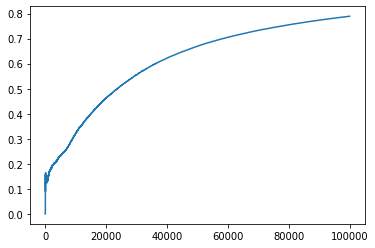

In [29]:
history_score = calc_history_score(R_history)
plt.plot([i for i in range(len(history_score))], history_score)

In [ ]:
print('Random_Agent, Average reward:',np.mean(R_save),'Number of steps: ',np.mean(N_moves_save))

In [32]:
with open('qtable.pickle', 'wb') as handle:
    pickle.dump(Qtable, handle)